### Imports

In [351]:

## Básicos

import pandas as pd
import numpy as np 
import statsmodels.api as sm
import patsy

## Gráficos

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from statsmodels.graphics.mosaicplot import mosaic

## Preprocesamiento

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV

## Modelos

from sklearn.linear_model import LogisticRegression
from statsmodels.formula.api import logit 
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

## Métricas

from pandas.plotting import scatter_matrix
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve
from sklearn.metrics import classification_report

## Estructura Final

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

## Interpretabilidad

import lime
import shap 

## Guardar modelo

import pickle


### Lectura dataset

In [4]:
df = pd.read_csv(r'2024_Citywide_Retention_Audit_-_Employee_Survey_Results.csv')

### Análisis y limpieza de data

#### Estructura y tipo de la data

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6523 entries, 0 to 6522
Data columns (total 29 columns):
 #   Column                                                                                                                                                                       Non-Null Count  Dtype 
---  ------                                                                                                                                                                       --------------  ----- 
 0   Survey Response Number                                                                                                                                                       6523 non-null   int64 
 1   Q1_How many years have you worked for the City?                                                                                                                              6523 non-null   object
 2   Q2_Have you ever transferred departments within the City?                           

Se puede visualizar que todos las variables, exceptuando la de "Survey Response Number", son de tipo categoría. Esto se debe a la naturaleza de la data, al provenir por de una encuesta, lo más problable es que hayan sido respuestas de mayor probabilidad de ser o pertenecer a un grupo en específico.

#### Valores únicos de las variables del dataset

In [10]:
for i in df.columns.to_list():
    print(df[i].name)
    print(df[i].unique())

Survey Response Number
[   1    2    3 ... 6521 6522 6523]
Q1_How many years have you worked for the City?
['Between 1 and 5 years' 'Less than a year' 'More than 15 years'
 '6 to 10 years' '11 to 15 years']
Q2_Have you ever transferred departments within the City?
['No, I have not transferred between City departments. I also have not applied to a job in another department while at my current department.'
 'No, I have not transferred between City departments. However, I have applied to a job in another department while at my current department.'
 'Yes, I have transferred between City departments.']
AltQ3A_ Additional career advancement opportunities
[nan 'Absolutely Essential' 'Very Important'
 'Neither Important Nor Unimportant' 'Not Important At All'
 'Of Little Importance']
AltQ3B_ Attractive retention incentives in the new department
[nan 'Absolutely Essential' 'Of Little Importance'
 'Neither Important Nor Unimportant' 'Very Important'
 'Not Important At All']
AltQ3C_ Better compen

Quitando el campo de "El Departamento al que pertenece" la mayoría de las variables categóricas no poseen más de 5 clases en la que está segmentada la información.

#### Variables a eliminar

In [13]:
eliminate = []
for i in df.columns:
    pp = df[i].isnull().sum()/len(df)*100
    eliminate.append(pp)

eliminate = pd.Series(data = eliminate, index = df.columns)

for i in eliminate[eliminate >= 50].index:
    df.drop([i], axis = 1, inplace = True)


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6523 entries, 0 to 6522
Data columns (total 23 columns):
 #   Column                                                                                                                                                                       Non-Null Count  Dtype 
---  ------                                                                                                                                                                       --------------  ----- 
 0   Survey Response Number                                                                                                                                                       6523 non-null   int64 
 1   Q1_How many years have you worked for the City?                                                                                                                              6523 non-null   object
 2   Q2_Have you ever transferred departments within the City?                           

Se procedió a eliminar las variables con más del 50% de sus valores nulos. Realizamos está acción porque restaurar columnas con más de la mitad de información vacía, y más siendo de tipo string, donde las imputaciones son más limitadas, se iba a sesgar mucho la data, lo cual no favorece. No se procedió a eliminar las filas donde se encuentran los valores nulos, debido a que no se posee mucha data con la que modelar. 

Se tienen 6,523 observaciones, a través de 23 columnas.

In [16]:
eliminate[eliminate >= 50].index

Index(['AltQ3A_ Additional career advancement opportunities',
       'AltQ3B_ Attractive retention incentives in the new department',
       'AltQ3C_ Better compensation/salary',
       'AltQ3D_ Better management/ co-workers/ department culture',
       'AltQ3E_ Dissatisfaction with how I was treated in my previous department',
       'AltQ3F_ More opportunities for telework/ flexible work hours'],
      dtype='object')

Las variables eliminadas son:

    - Additional career advancement opportunities 
    - Better compensation/salary 
    - Better management/ co-workers/ department culture 
    - Dissatisfaction with how I was treated in my previous department
    - More opportunities for telework/ flexible work hours

#### Renombrar las columnas

In [19]:
columns = ['id'
,'years_working'
,'transferred'
,'short_term_work'
,'long_term_work'
,'retire'
,'applied_job'
,'benefits'
,'career_opportunities'
,'commitment'
,'salary'
,'equitable_treatment'
,'department_culture'
,'pension'
,'telework'
,'opportunities_department'
,'opportunities_city'
,'work_balance'
,'feel_valued'
,'recommend_department'
,'recommend_city'
,'department'
,'retention_program']

In [20]:
df_1 = df.copy()
df_1.columns = columns

Con el propósito de tener una mayor facilidad al momento de manejar la información, se procedió a renombrar todas las variables con términos más utilizables. En ellas se tienen la idea de la cual trataba la pregunta o inquietud establecida.

#### Descripción estadística

In [23]:
df_1.describe(exclude=[np.number])

,years_working,transferred,short_term_work,long_term_work,retire,applied_job,benefits,career_opportunities,commitment,salary,...,pension,telework,opportunities_department,opportunities_city,work_balance,feel_valued,recommend_department,recommend_city,department,retention_program
count,6523,6523,6523,6523,6523,6523,6523,6523,6523,6523,...,6523,6523,6523,6523,6523,6523,6523,6523,6523,3738
unique,5,3,5,5,5,4,5,5,5,5,...,5,5,3,3,5,5,5,5,72,4
top,Between 1 and 5 years,"No, I have not transferred between City depart...",Extremely Likely,Extremely Likely,Extremely Likely,I have not applied for any jobs outside the City,Absolutely Essential,Very Important,Very Important,Absolutely Essential,...,Absolutely Essential,Absolutely Essential,Yes,No,Agree,Agree,Agree,Agree,Austin Energy,I am not aware of any retention programs offer...
freq,1934,3307,3367,1893,2629,3757,4438,2698,2694,4455,...,4187,3454,2909,3019,2476,2152,2150,2412,795,1604


##### Los valores con mayor frecuencia suelen ser los de sentimiento positivo, a través del conjunto de variables. Exceptuando "retention_program", todas las variables tienen su totalidad de observaciones.

#### Proporción de los valores para cada variable

In [26]:
for i in df_1.drop('id', axis = 1).columns:
    print(df_1[i].value_counts()/len(df_1)*100)

years_working
Between 1 and 5 years    29.648935
More than 15 years       24.252644
6 to 10 years            23.455465
11 to 15 years           13.306761
Less than a year          9.336195
Name: count, dtype: float64
transferred
No, I have not transferred between City departments. I also have not applied to a job in another department while at my current department.    50.697532
Yes, I have transferred between City departments.                                                                                              25.387092
No, I have not transferred between City departments. However, I have applied to a job in another department while at my current department.    23.915376
Name: count, dtype: float64
short_term_work
Extremely Likely      51.617354
Likely                25.356431
Neutral               12.110992
Extremely unlikely     5.472942
Unlikely               5.442281
Name: count, dtype: float64
long_term_work
Extremely Likely      29.020389
Likely                22.780929
N

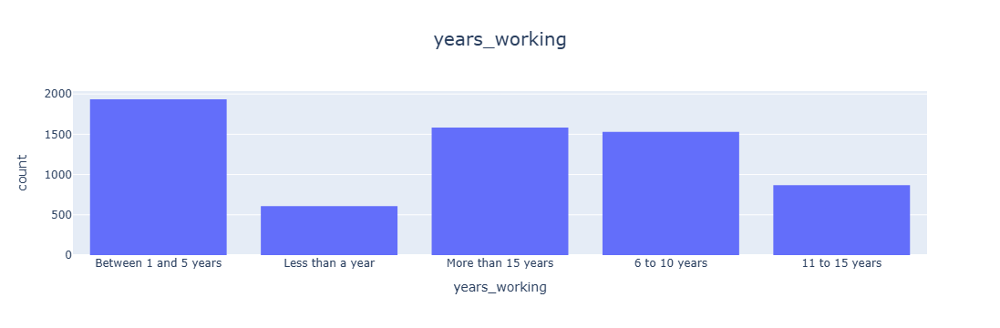

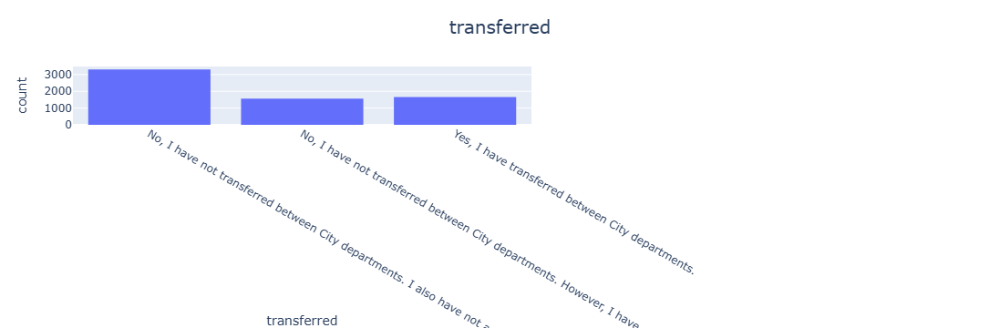

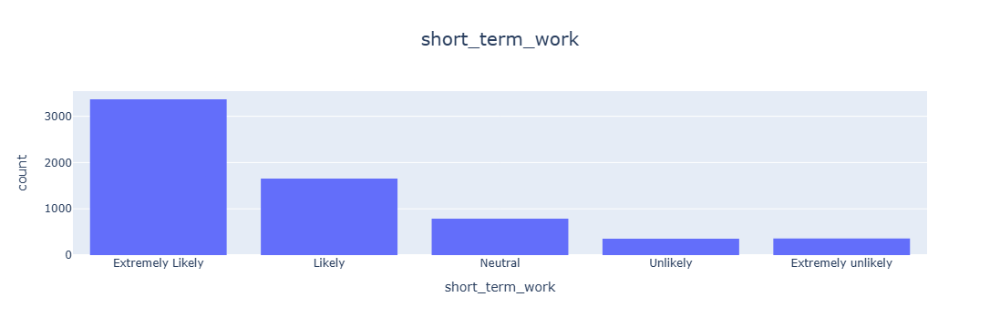

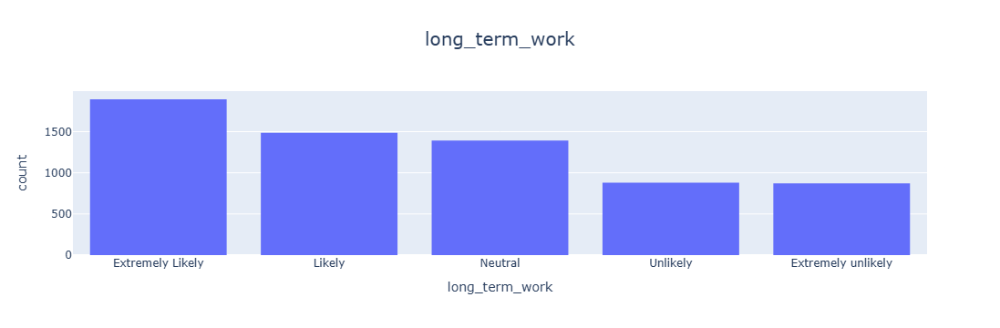

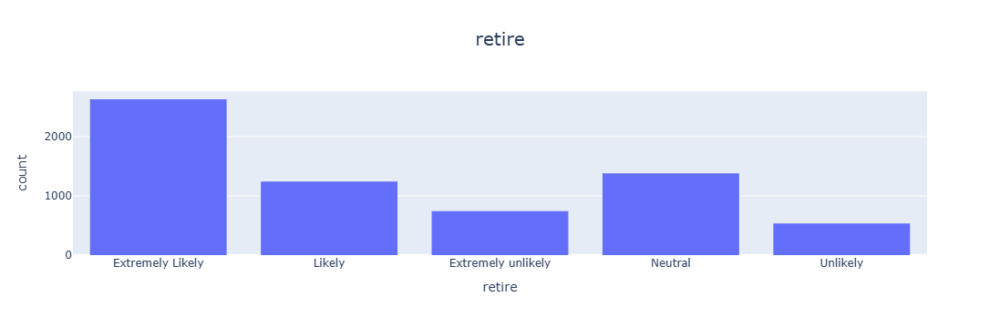

...

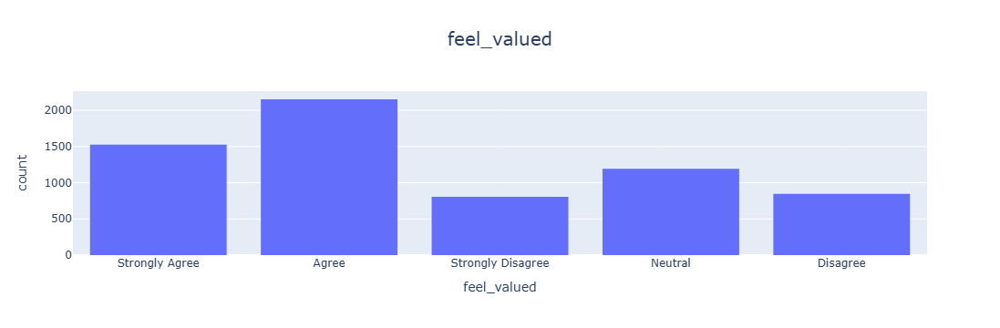

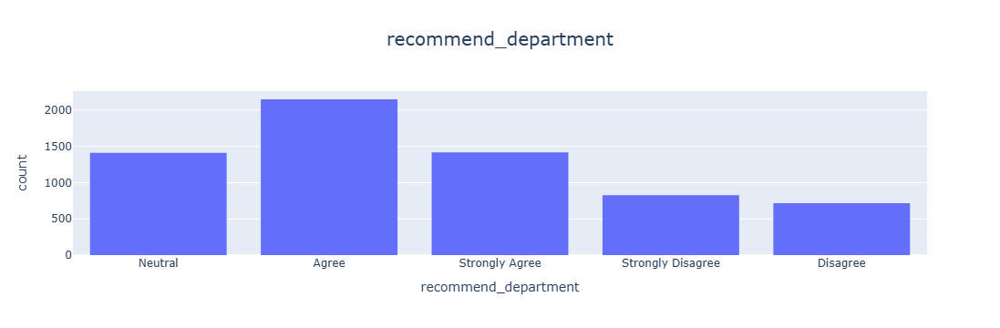

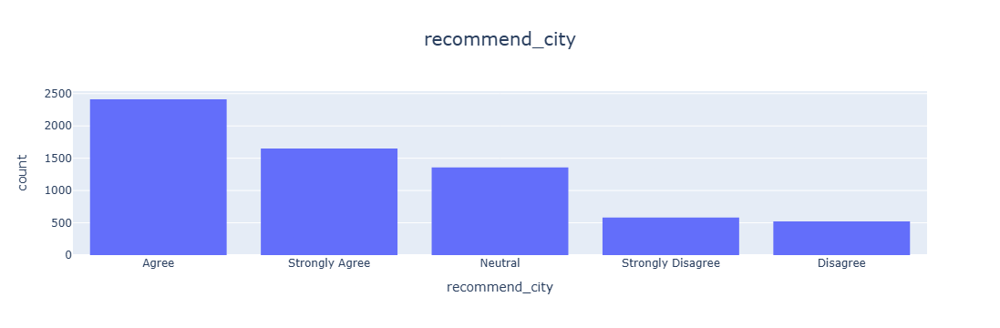

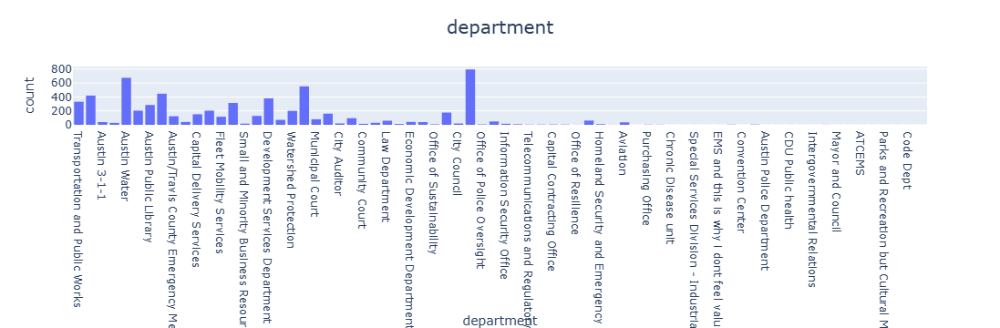

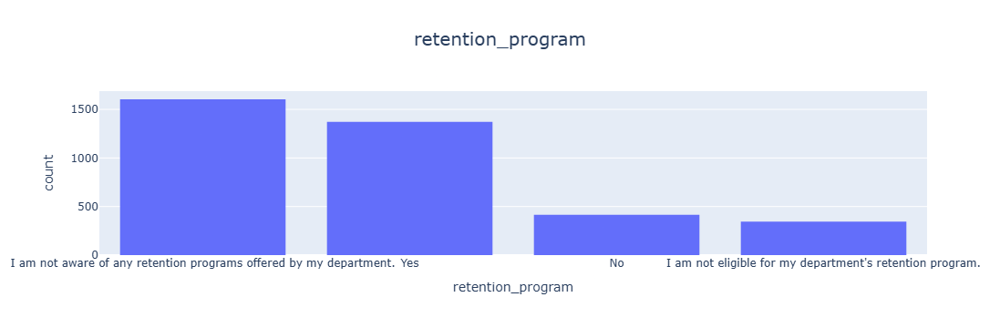

In [27]:
for i in df_1.drop('id', axis = 1).columns:
    fig = px.histogram(df_1, x = i, title = df_1[i].name) 
    fig.update_layout(
    title_font_size=20,
    title_x=0.5 )
    fig.show()

Como se puede observar, y para validar lo mencionado anteriormente, los valores con tonalidad positivo son los más recurrentes.

#### Segmentos de las variables categóricas

### Proceso de Transformar el DF

#### Nominal or Ordinal

In [32]:
ordinal = [['long_term_work', 'retire', 'benefits', 'career_opportunities', 'commitment','salary','equitable_treatment'
            ,'department_culture','pension','telework','work_balance', 'feel_valued', 'recommend_department', 'recommend_city']]
nominal = [['years_working','transferred', 'applied_job', 'opportunities_department', 'opportunities_city', 'department', 'retention_program']]
non = [['id']]
y = ['short_term_work']

Para tener una mayor perspectiva de cara a la transformación del dataset se dividió en 4 partes:

    - Ordinales: Son aquellas donde el orden y distancia entre los valores importan
    - Nominales: Variables que no tienen una secuencia dictaminada.
    - Variable objetivo: En este caso seria la denominada como "short_term_work", son aquellas personas que tienen o no pensado durar más de un año trabajando para la ciudad de Austin. 
    - Non: Las columnas que no necesitaran ninguna transformación.

In [34]:
df_2 = df_1.copy()

#### Ordinales

##### likely_unlikely (long_term_work y retire)

In [37]:
likely_unlikely = df_2[['long_term_work', 'retire']]

Estas de momento se mantendrán como están.

In [39]:
df_2['long_term_work'].value_counts()

long_term_work
Extremely Likely      1893
Likely                1486
Neutral               1392
Unlikely               879
Extremely unlikely     873
Name: count, dtype: int64

In [40]:
likely_unlikely_order = {
    'Extremely unlikely': 4,
    'Unlikely': 3,
    'Neutral': 2,
    'Likely': 1,
    'Extremely Likely': 0,
}

In [41]:
for i in likely_unlikely:
    df_2[i] = df_2[i].map(likely_unlikely_order)

In [42]:
df_2['retire'].value_counts()

retire
0    2629
2    1379
1    1241
4     740
3     534
Name: count, dtype: int64

In [43]:
df_1['retire'].value_counts()

retire
Extremely Likely      2629
Neutral               1379
Likely                1241
Extremely unlikely     740
Unlikely               534
Name: count, dtype: int64

Se le aplicó un ordinal encoder a los valores de las variables, donde se le da mayor valor a las respuestas más negativas, "Extremely unlikely", y menor valor a las más positivas, "Extremely likely".

##### agree (work_balance feel_valued recommend_department recommend_city)

In [46]:
agree = df_2[['work_balance', 'feel_valued', 'recommend_department', 'recommend_city']]

Se mantienen igual.

In [48]:
df_2['recommend_department'].value_counts()

recommend_department
Agree                2150
Strongly Agree       1417
Neutral              1412
Strongly Disagree     828
Disagree              716
Name: count, dtype: int64

In [49]:
agree_order = {
    'Strongly Disagree': 4,
    'Disagree': 3,
    'Neutral': 2,
    'Agree': 1,
    'Strongly Agree': 0,
}

In [50]:
for i in agree:
    df_2[i] = df_2[i].map(agree_order)

In [51]:
df_2['recommend_city'].value_counts()

recommend_city
1    2412
0    1650
2    1359
4     581
3     521
Name: count, dtype: int64

In [52]:
df_1['recommend_city'].value_counts()

recommend_city
Agree                2412
Strongly Agree       1650
Neutral              1359
Strongly Disagree     581
Disagree              521
Name: count, dtype: int64

Se le aplicó un ordinal encoder a los valores de las varibles, donde se le da mayor valor a las respuestas más negativas, "Strongly Disagree", y menor valor a las más positivas, "Strongly Agree".

##### importance (benefits, commitment, salary, equitable_treatment, department_culture,pension, telework, career_opportunities)

In [55]:
importance = df_2[['benefits', 'commitment', 'salary', 'equitable_treatment', 'department_culture','pension', 'telework', 'career_opportunities']]

In [56]:
def importance_label(var):
    if var in ['Neither Important Nor Unimportant']:
        return 'Not Important At All'
    else:
        return var

In [57]:
for i in importance:
    df_2[i] = df_2[i].apply(lambda x: importance_label(x))

Se agruparon los valores "Neither Important Nor Unimportant" con "Not Important At All", ya que no poseían muchas valores individualmente.

In [59]:
df_2['career_opportunities'].value_counts()

career_opportunities
Very Important          2698
Absolutely Essential    2580
Not Important At All     946
Of Little Importance     299
Name: count, dtype: int64

In [60]:
importance_order = {
    'Not Important At All': 3,
    'Of Little Importance': 2,
    'Very Important': 1,
    'Absolutely Essential': 0,
}

In [61]:
for i in importance:
    df_2[i] = df_2[i].map(importance_order)

In [62]:
df_2['career_opportunities'].value_counts()

career_opportunities
1    2698
0    2580
3     946
2     299
Name: count, dtype: int64

In [63]:
df_1['career_opportunities'].value_counts()

career_opportunities
Very Important                       2698
Absolutely Essential                 2580
Neither Important Nor Unimportant     863
Of Little Importance                  299
Not Important At All                   83
Name: count, dtype: int64

Se le aplicó un ordinal encoder a los valores de las varibles, donde se le da mayor valor a las respuestas más negativas, "Not Important At All", y menor valor a las más positivas, "Absolutely Essential". Se hace asi porque estas últimas son los empleados con menos riesgos de irse, y nos interesan los que tienen mayor posibilidad de partir.

#### Nominales

##### Para retention_program

In [67]:
df_2['retention_program'].isnull().sum()/len(df_2)*100

42.69507895140273

In [68]:
df_2['retention_program'].value_counts()/len(df_2['retention_program'])*100

retention_program
I am not aware of any retention programs offered by my department.    24.589913
Yes                                                                   21.048597
No                                                                     6.377434
I am not eligible for my department's retention program.               5.288977
Name: count, dtype: float64

In [69]:
df_2.columns.shape[0]

23

In [70]:
df_2.drop('retention_program', axis = 1, inplace = True)

In [71]:
df_2.columns.shape[0]

22

Debido el alto porcentaje de valores nulos que posee la variable, 43%, y dado que el 25% de la data cae en un campo inconcluso, el cual no aportaría mucho detalle explicativo pasaremos a dropearla del dataset de cara a la modelización. 

##### Para opportunities_department, opportunities_city

In [74]:
department = df_2[['opportunities_department']]

In [75]:
def department_label(var):
    if var in ['I am unaware of any training or development opportunities offered by my department.']:
        return 'Unaware'
    else:
        return var

In [76]:
for i in department:
    df_2[i] = df_2[i].apply(lambda x: department_label(x))

In [77]:
city = df_2[['opportunities_city']]

In [78]:
def city_label(var):
    if var in ['I am unaware of any training or development opportunities offered the City.']:
        return 'Unaware'
    else:
        return var

In [79]:
for i in city:
    df_2[i] = df_2[i].apply(lambda x: city_label(x))

Se paso al bajar un poco la verbosidad de los valores para estas variables para mayor sencillez.

##### Para years_working

In [82]:
years_working = df_2[['years_working']]

In [83]:
def years_working_label(var):
    if var in ['Less than a year']:
        return 'Less_1_year'
    elif var in ['Between 1 and 5 years']:
        return '1_to_5_years'
    elif var in ['6 to 10 years']:
        return '6_to_10_years'
    elif var in ['11 to 15 years']:
        return '11_to_15_years'
    else:
        return 'More_15_years'

In [84]:
for i in years_working:
    df_2[i] = df_2[i].apply(lambda x: years_working_label(x))

Por igual se reformuló la estructura de los valores de "years_working", colocandolo todo en una misma palabra compuesta.

##### Para transferred

In [87]:
transferred = df_2[['transferred']]

In [88]:
def transferred_label(var):
    if var in ['No, I have not transferred between City departments. I also have not applied to a job in another department while at my current department.']:
        return 'Not_Applied'
    elif var in ['No, I have not transferred between City departments. However, I have applied to a job in another department while at my current department.']:
        return 'Applied'
    else:
        return 'Yes'

In [89]:
for i in transferred:
    df_2[i] = df_2[i].apply(lambda x: transferred_label(x))

Se redujo la cantidad de palabra para un mismo valor a una.

##### Para applied_job

In [92]:
applied_job = df_2[['applied_job']]

In [93]:
def applied_job_label(var):
    if var in ['I have not applied for any jobs outside the City']:
        return 'No'
    elif var in ['Within the past 3 months', '3 months to 6 months ago']:
        return '1_to_6_months'
    else:
        return 'Over_6_months'

Se agruparon las variables de "Within the past 3 month"  y de "3 months to 6 months ago" en una sola etiqueta, dada su bajo nivel de observaciones. A su vez, se redujo la verbosidad. 

In [95]:
for i in applied_job:
    df_2[i] = df_2[i].apply(lambda x: applied_job_label(x))

##### Para department

In [97]:
df_2['department'].unique().shape[0]

72

In [98]:
df_2['department'].unique()

array(['Transportation and Public Works', 'I Prefer Not to Disclose',
       'Austin 3-1-1', 'Forensic Science Department', 'Austin Water',
       'Fire Department', 'Austin Public Library', 'Austin Public Health',
       'Austin/Travis County Emergency Medical Services',
       'Housing Department', 'Capital Delivery Services',
       'Financial Services Department', 'Fleet Mobility Services',
       'Parks and Recreation', 'Small and Minority Business Resources',
       'Austin Resource Recovery', 'Development Services Department',
       'Human Resources', 'Watershed Protection', 'Police Department',
       'Municipal Court', 'Communications and Technology Management',
       'City Auditor', 'Austin Convention Center', 'Community Court',
       'Communications and Public Information Office', 'Law Department',
       'City Clerk', 'Economic Development Department',
       'Planning Department', 'Office of Sustainability',
       'Austin-Bergstrom International Airport', 'City Council

Dividirlo por grupos

In [100]:
categorized_departments = {
    "Salud": [
        "Austin Public Health",                             
        "Austin/Travis County Emergency Medical Services",  
        "Office of the Chief Medical Officer",              
        "Chronic Disease Unit",                             
        "EMS",                                              
        "CDU Public health",                                
        "ATCEMS",                                           
        "EMS and this is why i dont feel valued by the city. They dont include us in the department drop down list!!!!!", 
        "EMS, the fact that my department was not listed on this list makes me want to go back and change some of my answers",
        "Chronic Disease unit",
    ],
    "Seguridad": [
        "Fire Department",                                  
        "Police Department",                                
        "Austin Police Department",                         
        "Forensic Science Department",                      
        "Homeland Security and Emergency Management",       
        "Austin Security",                                  
        "Office of Police Oversight",                       
        "Code Department",                                  
        "Code Dept",                                        
        "Austin Animal Center",                             
    ],
    "Public_Serv": [
        "Austin 3-1-1",                                      
        "Austin Water",                                      
        "Austin Resource Recovery",                          
        "Watershed Protection",                              
        "Building Services",                                 
        "Transportation and Public Works",                   
        "Austin Energy",                                     
        "Utility Forestry",                                  
        "Special Services Division - Industrial Waste",      
        "warehouse",                                         
    ],
    "Transporte_Infr": [
        "Austin-Bergstrom International Airport",            
        "Aviation",                                          
        "Fleet Mobility Services",                           
        "Austin Convention Center",                          
        "Convention Center", 
        "Development Services Department",
    ],
    "Govt": [
        "City Manager",                                      
        "City Council",                                      
        "Mayor and Council",                                 
        "Office of Resilience",                              
        "Office of Real Estate Services",                    
        "Telecommunications and Regulatory Affairs",         
        "City Clerk",                                        
        "Intergovernmental Relations",                       
        "Office of Civil Rights",                            
        "Office of Sustainability",                          
        "Equity Office",                                     
        "Innovation Office",                                 
        "City Auditor",                                      
        "Capital Contracting Office",                        
        "Capital Delivery Services",                         
        "Capital Delivery Services Dept.",                   
        "Financial Services Department",                     
        "Purchasing Office",
        "Human Resources",
    ],
    "Legal": [
        "Law Department",                                    
        "Municipal Court",                                   
        "Community Court",                                   
        "Downtown Austin Community Court",                   
    ],
    "TI": [
        "Communications and Technology Management",          
        "Information Security Office",                       
    ],
    "Education": [
        "Austin Public Library",                             
        "Parks and Recreation but Cultural Museums",
        "Parks and Recreation",
    ],
    "Estrategia": [
        "Planning Department",                               
        "Economic Development Department",                   
        "Small and Minority Business Resources",             
        "Housing Department",                                
        "Homeless Strategy Office",                          
        "Innovation Office",                                 
    ],
    "Others": [
        "I Prefer Not to Disclose",                          
        "RATHER NOT SAY DUE TO RETALIATION",                   
        "BSD",                                                                             
        "Communications and Public Information Office",      
    ]
}


In [101]:
department_to_category = {
    dept: category
    for category, depts in categorized_departments.items()
    for dept in depts
}

df_2['department_cat'] = df_2['department'].map(department_to_category)

In [102]:
for i in df_2['department_cat'].unique():
    print(i)
    print('-------------------------------------------------------------')
    print(df_2[df_2['department_cat'] == i]['department'].value_counts())
    print('-------------------------------------------------------------')

Public_Serv
-------------------------------------------------------------
department
Austin Energy                                   795
Austin Water                                    675
Transportation and Public Works                 331
Watershed Protection                            201
Austin Resource Recovery                        128
Building Services                                61
Austin 3-1-1                                     39
Special Services Division - Industrial Waste      1
warehouse                                         1
Utility Forestry                                  1
Name: count, dtype: int64
-------------------------------------------------------------
Others
-------------------------------------------------------------
department
I Prefer Not to Disclose                        420
Communications and Public Information Office     29
BSD                                               1
RATHER NOT SAY DUE TO RETALIATION                 1
Name: count, dtype:

In [103]:
df_2['department_cat'].value_counts()

department_cat
Public_Serv        2233
Seguridad           853
Transporte_Infr     804
Education           600
Salud               580
Govt                527
Others              451
TI                  175
Legal               154
Estrategia          146
Name: count, dtype: int64

In [104]:
df_2.drop('department', axis = 1, inplace = True)

Debido a la alta cardinalidad de la variable departamentos, y dado a varios valores sin mucho valor, se decidió agrupar en grupos. Se designaron los grupos por la relación a la actividad económica de la que se encargan esas instituciones.

##### Para short_term_work (y)

In [107]:
short_term = df_2[['short_term_work']]

In [108]:
def short_term_ohe(var):
    if var in ['Extremely Likely','Likely']:
        return 0
    else:
        return 1

In [109]:
for i in short_term:
    df_2[i] = df_2[i].apply(lambda x: short_term_ohe(x))

In [110]:
df_2['short_term_work'].value_counts()

short_term_work
0    5021
1    1502
Name: count, dtype: int64

In [111]:
df_1['short_term_work'].value_counts()

short_term_work
Extremely Likely      3367
Likely                1654
Neutral                790
Extremely unlikely     357
Unlikely               355
Name: count, dtype: int64

In [112]:
df_2['short_term_work'].value_counts()/len(df_2)*100

short_term_work
0    76.973785
1    23.026215
Name: count, dtype: float64

Se agruparon las etiquetas positivas, bajo el 0, debido a que son las personas menos probables de dejar el trabajo en el próximo año. El resto, compuesto por los empleados con incertidumbre y con decisión de dejar su trabajo se catalogaron con 1.

La variable objetivo se encuentra un tanto desbalanceada. De seguro tendrá problemas para identificar los 1. Puede que sirva balancearlas.

##### Validando el df creado

In [115]:
print(df_2['department_cat'].value_counts())
print('--------------------------------------------')
print('Total de valores')
print(df_2['department_cat'].value_counts().sum())

department_cat
Public_Serv        2233
Seguridad           853
Transporte_Infr     804
Education           600
Salud               580
Govt                527
Others              451
TI                  175
Legal               154
Estrategia          146
Name: count, dtype: int64
--------------------------------------------
Total de valores
6523


In [116]:
df_2.columns

Index(['id', 'years_working', 'transferred', 'short_term_work',
       'long_term_work', 'retire', 'applied_job', 'benefits',
       'career_opportunities', 'commitment', 'salary', 'equitable_treatment',
       'department_culture', 'pension', 'telework', 'opportunities_department',
       'opportunities_city', 'work_balance', 'feel_valued',
       'recommend_department', 'recommend_city', 'department_cat'],
      dtype='object')

##### One Hot Encoder (OHE) para las nominales

Se realizaran dos tablas, una para Modelos de Arbol y otra para una Regresión Logaritmica.

##### Logistic Table 

In [120]:
nominal = df_2[['id','years_working','transferred', 'applied_job', 'opportunities_department', 'opportunities_city', 'department_cat']]

In [121]:
df_2['department_cat'].value_counts()

department_cat
Public_Serv        2233
Seguridad           853
Transporte_Infr     804
Education           600
Salud               580
Govt                527
Others              451
TI                  175
Legal               154
Estrategia          146
Name: count, dtype: int64

In [122]:
nominal.set_index('id', inplace = True)

In [123]:
encoder = OneHotEncoder(sparse_output = False)

ohe = encoder.fit_transform(nominal)

columns = encoder.get_feature_names_out(nominal.columns)

nominales_df = pd.DataFrame(ohe, columns=columns, index = df_2['id'])

In [124]:
logistict_drop = ['years_working_1_to_5_years', 'transferred_Not_Applied', 'applied_job_No',
                  'opportunities_department_Yes', 'opportunities_city_No', 'department_cat_Public_Serv']

In [125]:
nominales_df = nominales_df.reset_index()

In [126]:
nominales_df = nominales_df.drop(columns = logistict_drop)

In [127]:
nominal_drop = ['years_working','transferred', 'applied_job', 'opportunities_department', 'opportunities_city', 'department_cat']
#df_logistic = pd.concat([df_2.drop(columns = nominal_drop),nominales_df.drop(columns = ['id'])], axis = 1, ignore_index = True)
df_logistic = pd.merge(df_2.drop(columns = nominal_drop), nominales_df, on = 'id', how = 'outer')

In [128]:
pd.set_option('display.max_columns', None)   

Validando que esten bien

In [130]:
df_logistic[df_logistic['id'] == 17]

,id,short_term_work,long_term_work,retire,benefits,career_opportunities,commitment,salary,equitable_treatment,department_culture,pension,telework,work_balance,feel_valued,recommend_department,recommend_city,years_working_11_to_15_years,years_working_6_to_10_years,years_working_Less_1_year,years_working_More_15_years,transferred_Applied,transferred_Yes,applied_job_1_to_6_months,applied_job_Over_6_months,opportunities_department_No,opportunities_department_Unaware,opportunities_city_Unaware,opportunities_city_Yes,department_cat_Education,department_cat_Estrategia,department_cat_Govt,department_cat_Legal,department_cat_Others,department_cat_Salud,department_cat_Seguridad,department_cat_TI,department_cat_Transporte_Infr
16,17,0,0,0,0,3,0,0,0,0,0,0,1,1,1,1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [131]:
df_2[df_2['id'] == 17]

,id,years_working,transferred,short_term_work,long_term_work,retire,applied_job,benefits,career_opportunities,commitment,salary,equitable_treatment,department_culture,pension,telework,opportunities_department,opportunities_city,work_balance,feel_valued,recommend_department,recommend_city,department_cat
16,17,Less_1_year,Not_Applied,0,0,0,No,0,3,0,0,0,0,0,0,Unaware,Unaware,1,1,1,1,Govt


Lo que se realizó fue aplicarle el proceso de dummys a todas los valores participes de las variables catalogadas como nominales. Estas tomara valores de 0 y 1. Se pasaron a dropear las variables con mayor mayor frecuencia para evitar multicolinealidad en el modelado con Regresión Logística, y así hacer la comparación con esas variables, de realizar el modelo de forma de minería de datos y con el paquete de statsmodel.

##### Tree table

In [134]:
nominal = df_2[['id','years_working','transferred', 'applied_job', 'opportunities_department', 'opportunities_city', 'department_cat']]

In [135]:
nominal.set_index('id', inplace = True)

In [136]:
encoder = OneHotEncoder(sparse_output = False)

ohe = encoder.fit_transform(nominal)

columns = encoder.get_feature_names_out(nominal.columns)

nominales_df_1 = pd.DataFrame(ohe, columns=columns, index = df_2['id'])

In [137]:
nominales_df_1 = nominales_df_1.reset_index()

In [138]:
nominal_drop = ['years_working','transferred', 'applied_job', 'opportunities_department', 'opportunities_city', 'department_cat']
#df_logistic = pd.concat([df_2.drop(columns = nominal_drop),nominales_df.drop(columns = ['id'])], axis = 1, ignore_index = True)
df_tree = pd.merge(df_2.drop(columns = nominal_drop), nominales_df_1, on = 'id', how = 'outer')

In [139]:
df_tree[df_tree['id'] == 322]

,id,short_term_work,long_term_work,retire,benefits,career_opportunities,commitment,salary,equitable_treatment,department_culture,pension,telework,work_balance,feel_valued,recommend_department,recommend_city,years_working_11_to_15_years,years_working_1_to_5_years,years_working_6_to_10_years,years_working_Less_1_year,years_working_More_15_years,transferred_Applied,transferred_Not_Applied,transferred_Yes,applied_job_1_to_6_months,applied_job_No,applied_job_Over_6_months,opportunities_department_No,opportunities_department_Unaware,opportunities_department_Yes,opportunities_city_No,opportunities_city_Unaware,opportunities_city_Yes,department_cat_Education,department_cat_Estrategia,department_cat_Govt,department_cat_Legal,department_cat_Others,department_cat_Public_Serv,department_cat_Salud,department_cat_Seguridad,department_cat_TI,department_cat_Transporte_Infr
321,322,0,0,0,0,0,0,0,3,3,0,0,2,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [140]:
df_2[df_2['id'] == 322]

,id,years_working,transferred,short_term_work,long_term_work,retire,applied_job,benefits,career_opportunities,commitment,salary,equitable_treatment,department_culture,pension,telework,opportunities_department,opportunities_city,work_balance,feel_valued,recommend_department,recommend_city,department_cat
321,322,1_to_5_years,Yes,0,0,0,No,0,0,0,0,3,3,0,0,Unaware,Unaware,2,0,0,0,Govt


Como para los algoritmos de árbol no importa la multicolinalidad, se dejan todas las columnas, ya que no tienen muchas categorías.

#### Analisis Exploratorio 

Graficamos las variables independiente con respecto a la dependiente para ver la relación que tienen y observar posibles columnas diferenciadoras y significativas para el modelo.

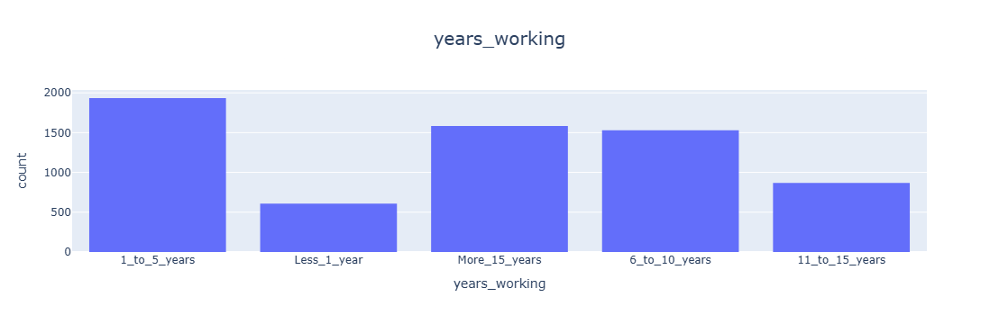

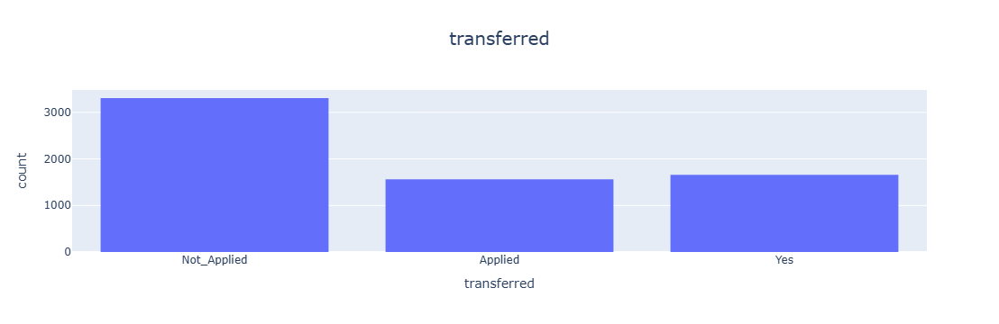

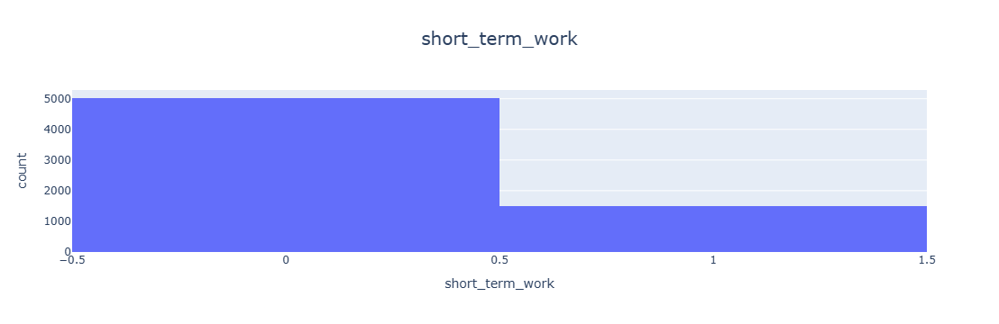

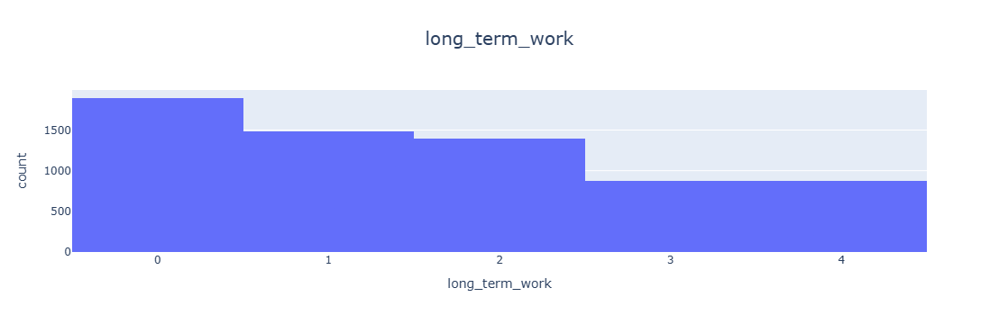

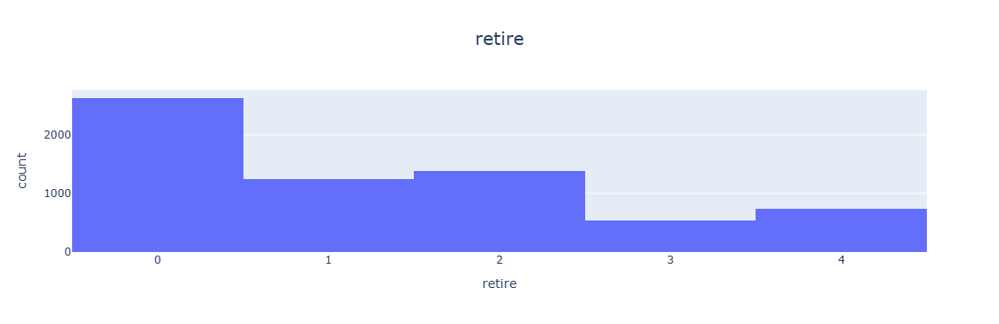

...

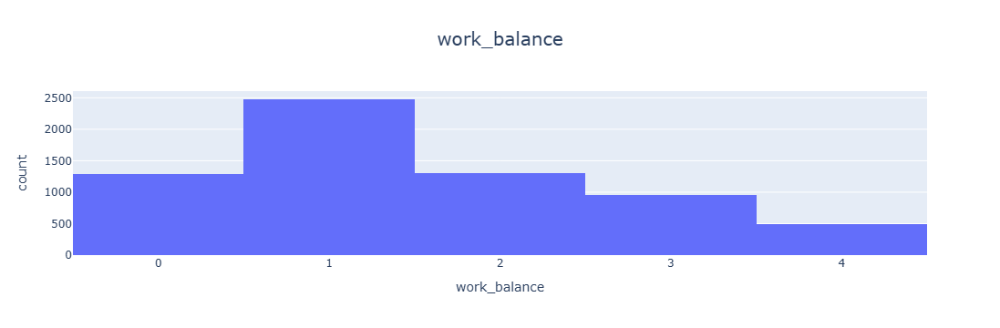

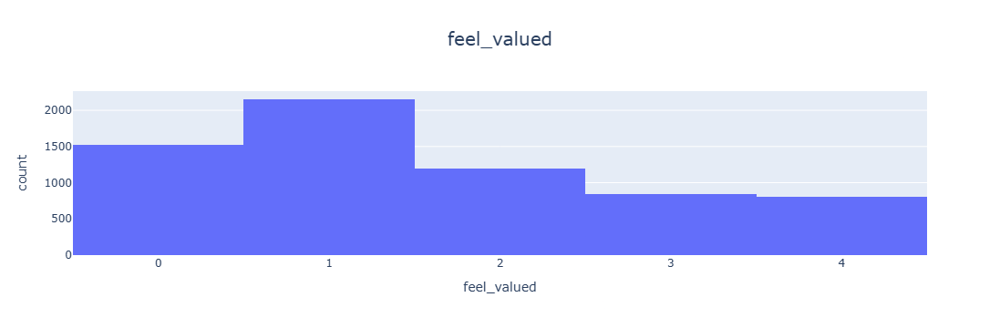

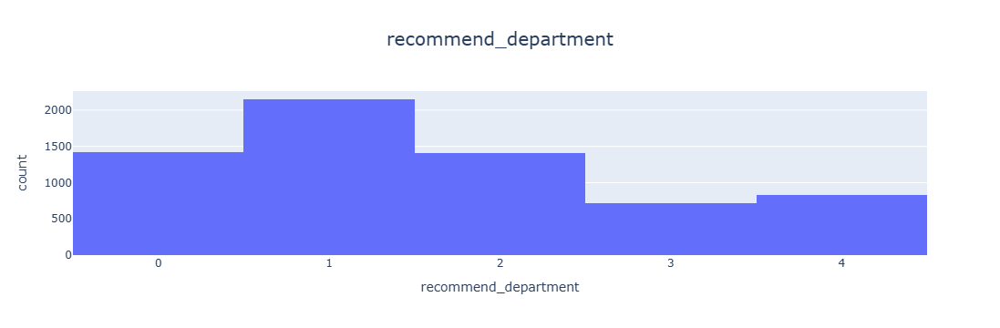

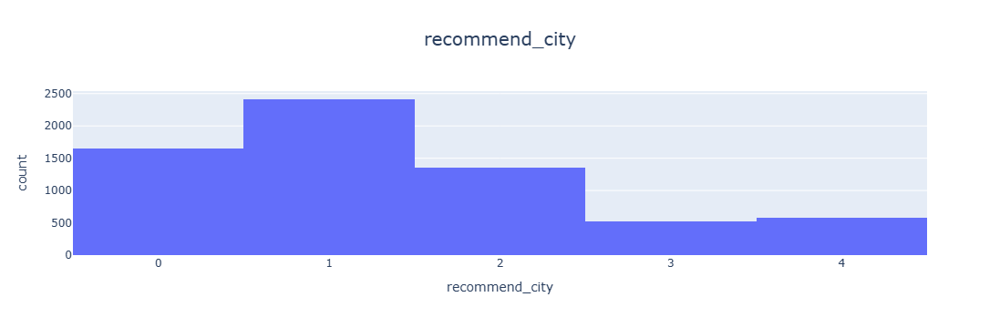

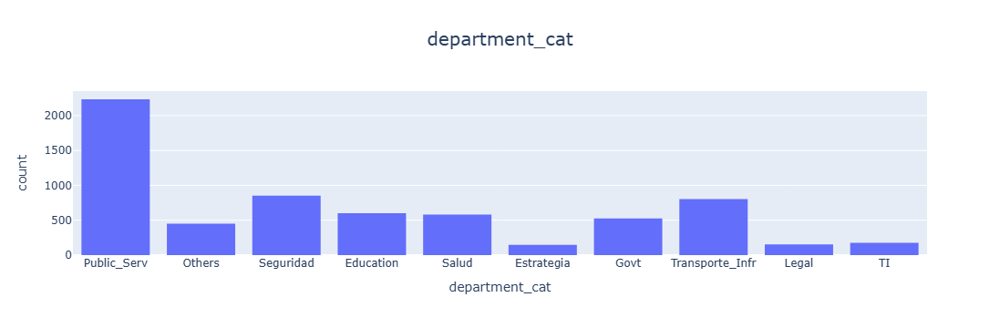

In [144]:
for i in df_2.drop('id', axis = 1).columns:
    fig = px.histogram(df_2, x = i, title = df_2[i].name) 
    fig.update_layout(
    title_font_size=20,
    title_x=0.5 )
    fig.show()

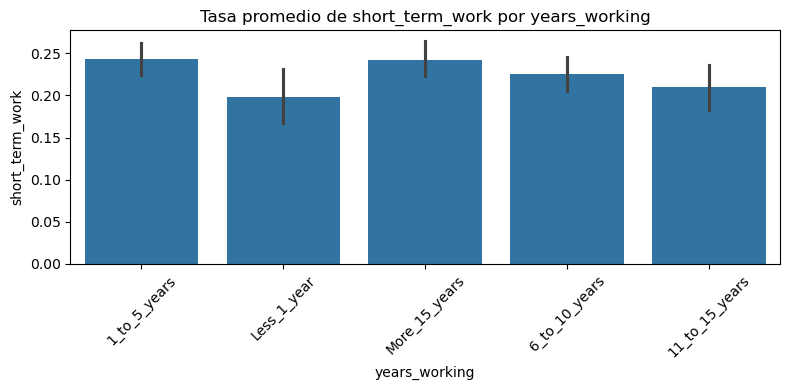

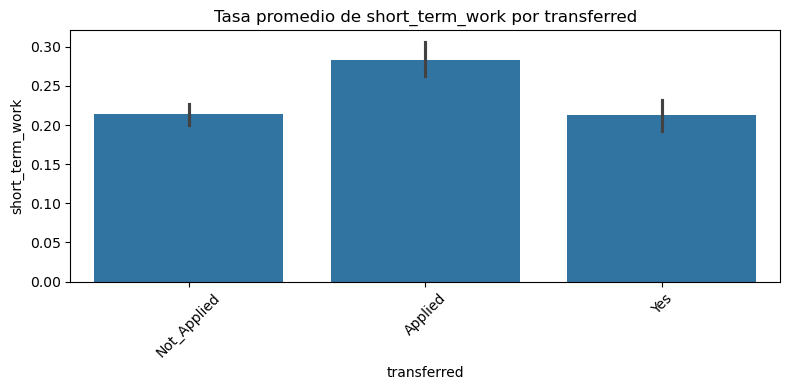

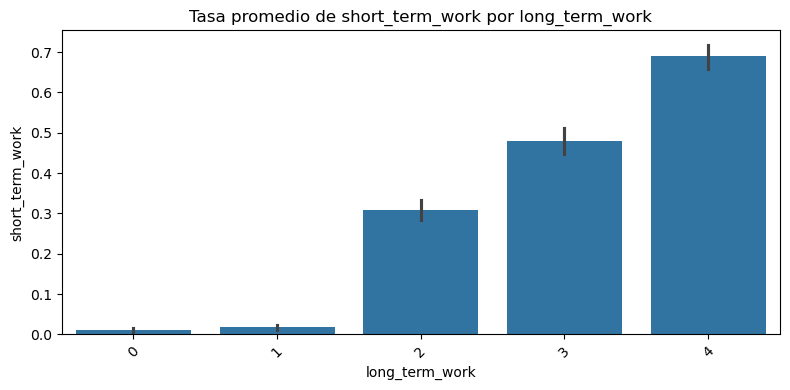

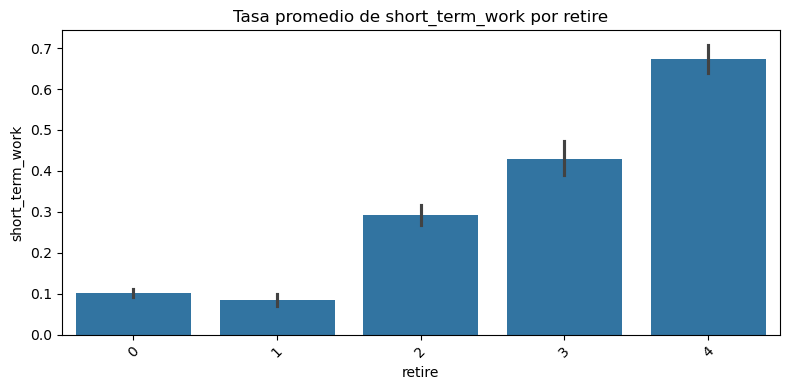

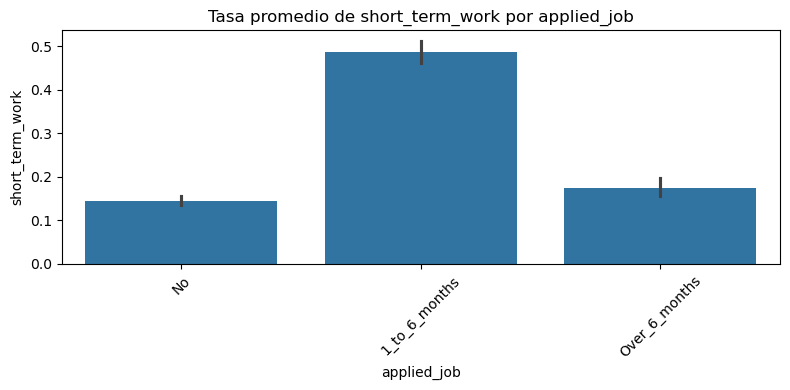

...

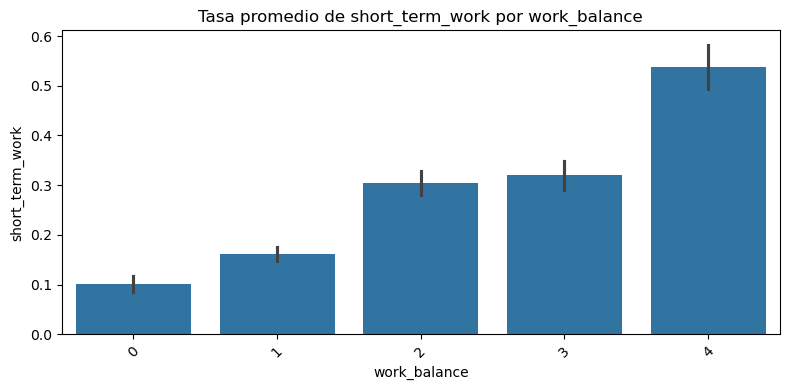

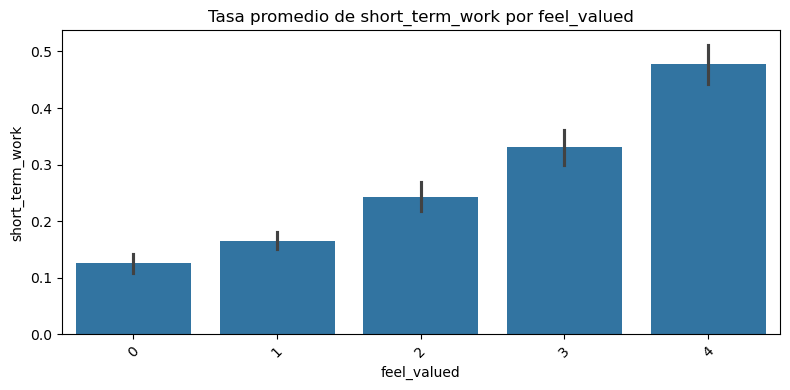

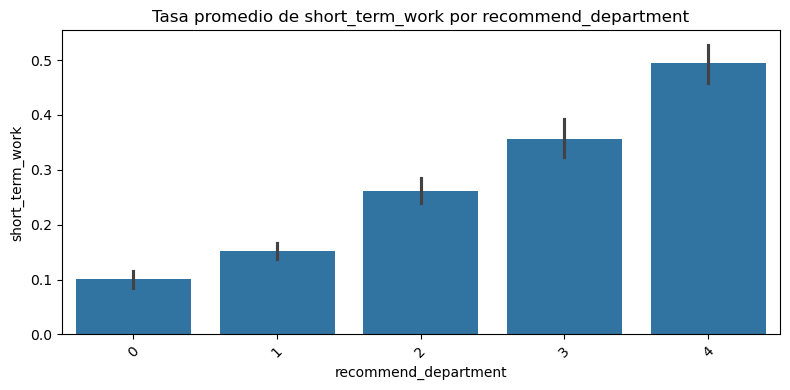

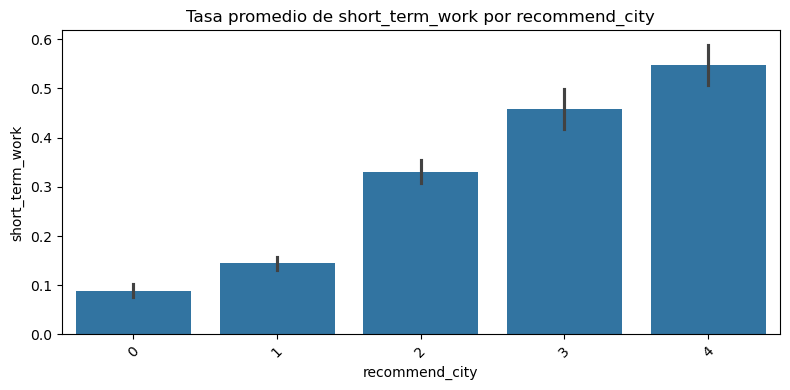

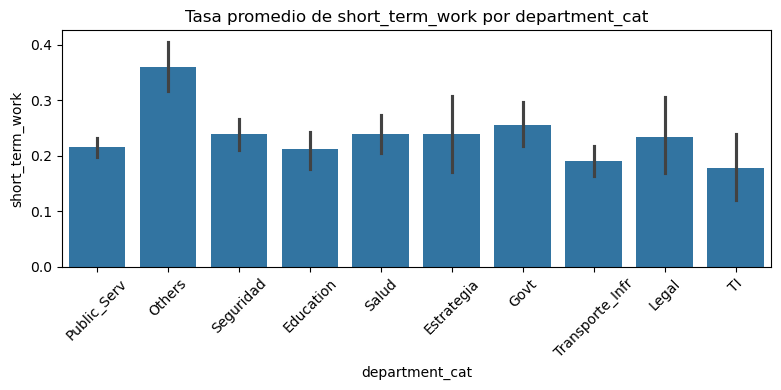

In [145]:
for i in df_2.drop(columns = ['short_term_work','id'], axis = 1).columns:
    plt.figure(figsize = (8, 4))  
    sns.barplot(data = df_2, x = i, y = 'short_term_work', estimator = 'mean')
    plt.xticks(rotation = 45)
    plt.title(f'Tasa promedio de short_term_work por {i}')
    plt.tight_layout()
    plt.show()
 


In [146]:
X = df_tree.drop(['short_term_work', 'id'], axis=1)
y = df_tree['short_term_work']

importances = mutual_info_classif(X, y, discrete_features = True)
feature_scores = pd.Series(importances, index = X.columns).sort_values(ascending = False)
print(feature_scores)

long_term_work                      1.935720e-01
retire                              9.674373e-02
recommend_city                      6.237760e-02
applied_job_1_to_6_months           5.083867e-02
recommend_department                4.492357e-02
work_balance                        3.942703e-02
feel_valued                         3.389681e-02
applied_job_No                      2.799319e-02
pension                             2.051186e-02
opportunities_city_Yes              1.897909e-02
opportunities_department_Yes        1.690376e-02
benefits                            1.686275e-02
opportunities_city_No               1.163719e-02
opportunities_department_No         1.072059e-02
commitment                          9.924985e-03
salary                              4.150514e-03
career_opportunities                3.804794e-03
department_culture                  3.340096e-03
department_cat_Others               3.163982e-03
equitable_treatment                 2.771896e-03
transferred_Applied 

In [147]:
df_encoded = pd.get_dummies(df_tree.drop(columns = ['short_term_work', 'id']), drop_first=True)
df_encoded['short_term_work'] = df_tree['short_term_work']

correlaciones = pd.Series(df_encoded.corr(numeric_only=True)['short_term_work'].drop('short_term_work').sort_values(ascending=False))

pd.set_option('display.max_rows', None)   

print(correlaciones)

#sns.heatmap(correlaciones.to_frame(), annot=True, cmap='coolwarm')
#plt.title('Correlación de variables codificadas con la variable objetivo')
#plt.show()

long_term_work                      0.573502
retire                              0.431322
recommend_city                      0.352991
applied_job_1_to_6_months           0.335689
recommend_department                0.302082
work_balance                        0.275858
feel_valued                         0.261934
pension                             0.204155
benefits                            0.190885
opportunities_city_No               0.152516
opportunities_department_No         0.147270
commitment                          0.125015
department_cat_Others               0.083469
transferred_Applied                 0.070675
career_opportunities                0.069143
salary                              0.068866
equitable_treatment                 0.061309
department_culture                  0.058754
opportunities_department_Unaware    0.050177
opportunities_city_Unaware          0.043956
years_working_1_to_5_years          0.019672
department_cat_Govt                 0.018242
years_work

<Figure size 800x400 with 0 Axes>

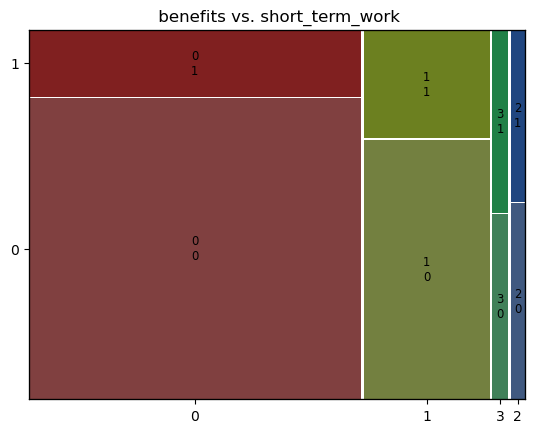

<Figure size 800x400 with 0 Axes>

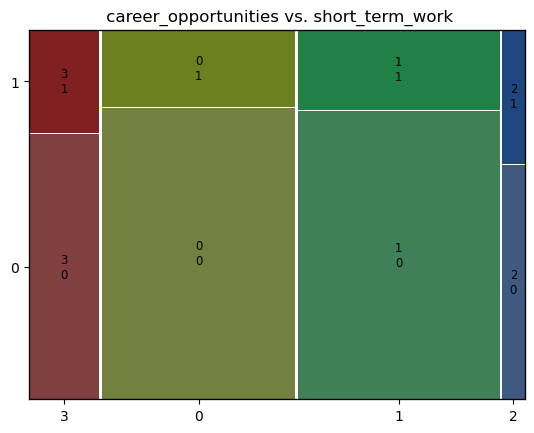

<Figure size 800x400 with 0 Axes>

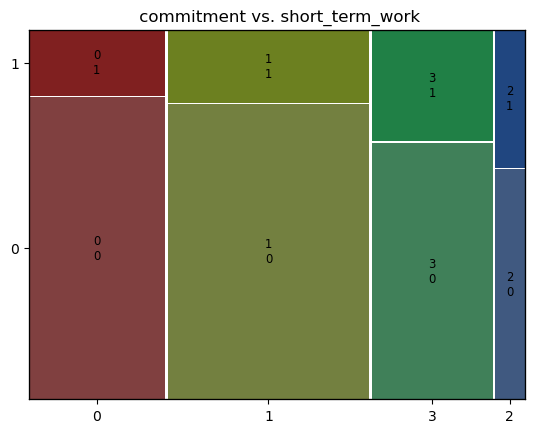

<Figure size 800x400 with 0 Axes>

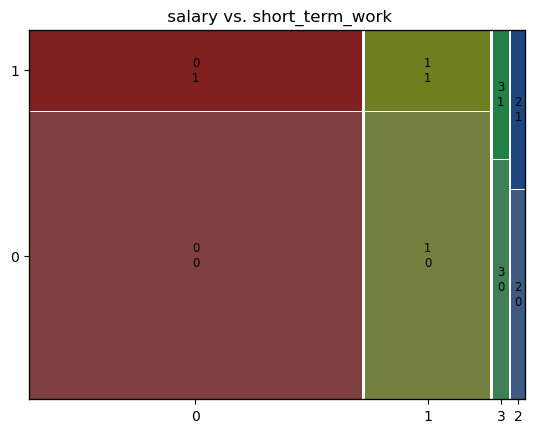

<Figure size 800x400 with 0 Axes>

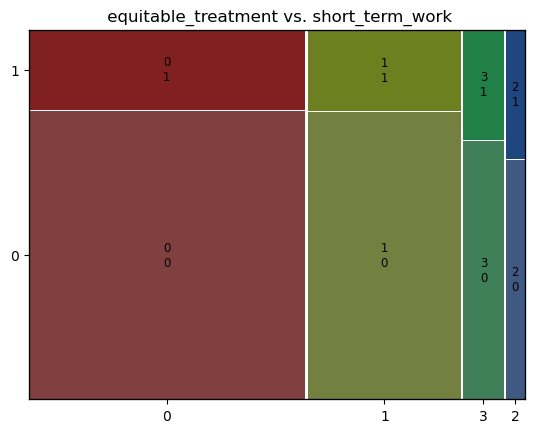

<Figure size 800x400 with 0 Axes>

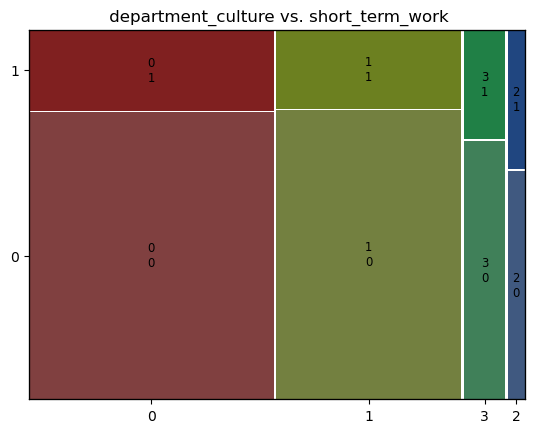

<Figure size 800x400 with 0 Axes>

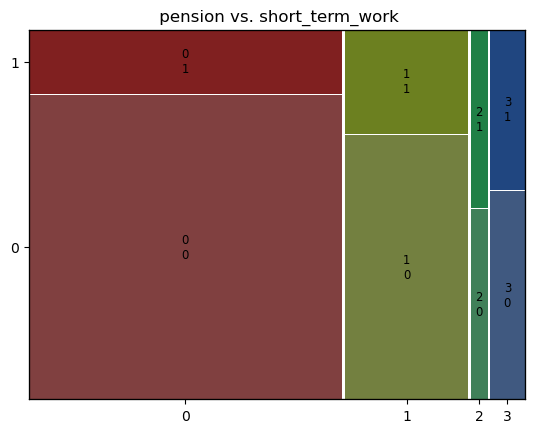

<Figure size 800x400 with 0 Axes>

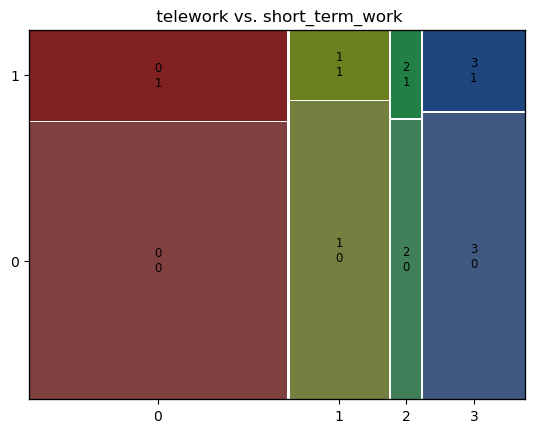

<Figure size 800x400 with 0 Axes>

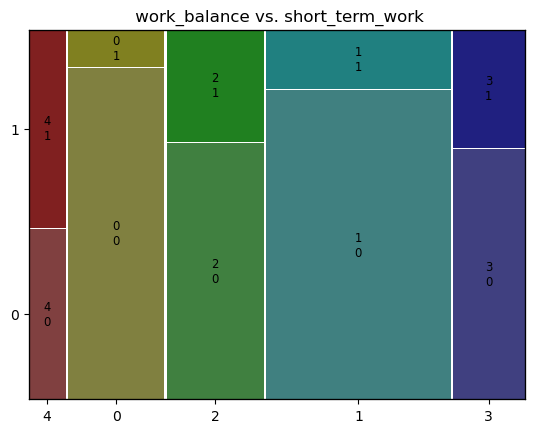

<Figure size 800x400 with 0 Axes>

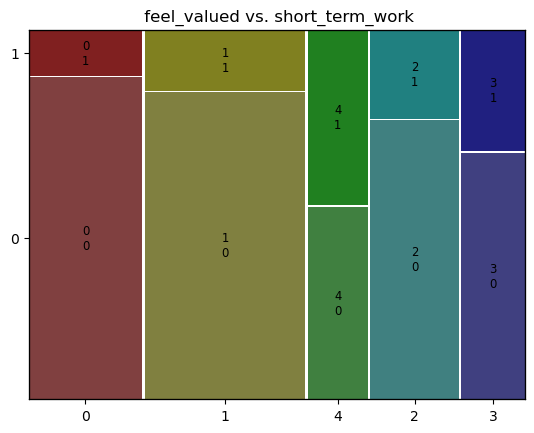

<Figure size 800x400 with 0 Axes>

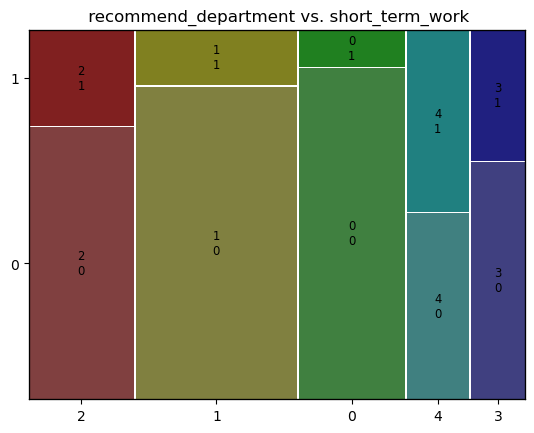

<Figure size 800x400 with 0 Axes>

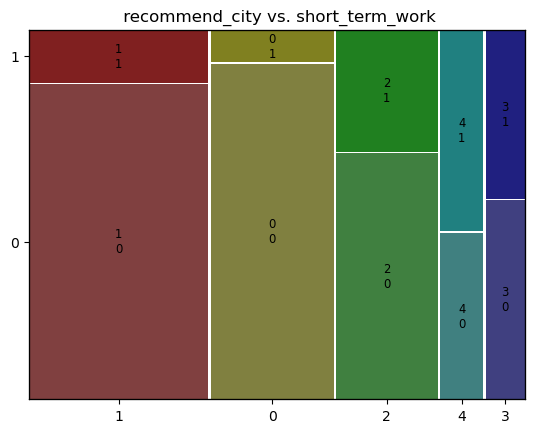

<Figure size 800x400 with 0 Axes>

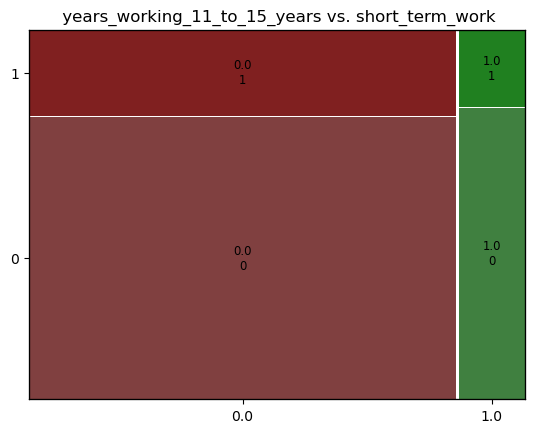

<Figure size 800x400 with 0 Axes>

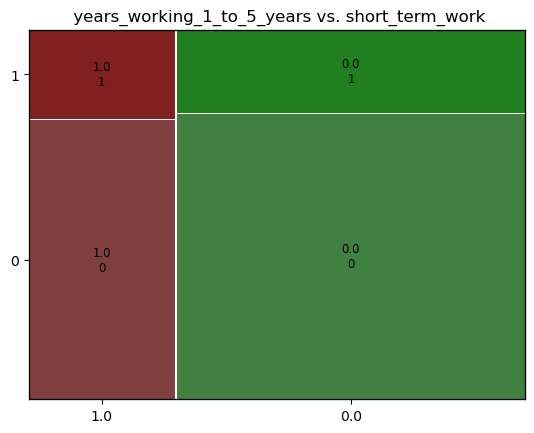

<Figure size 800x400 with 0 Axes>

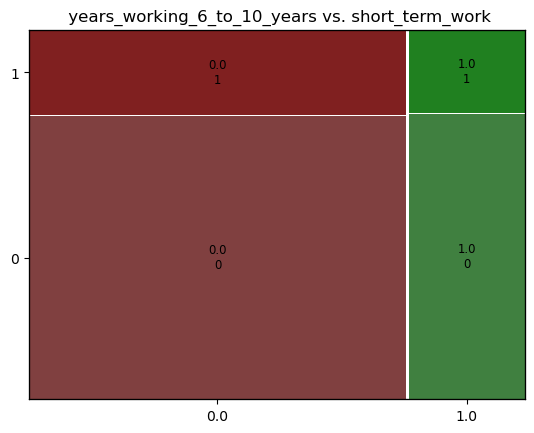

<Figure size 800x400 with 0 Axes>

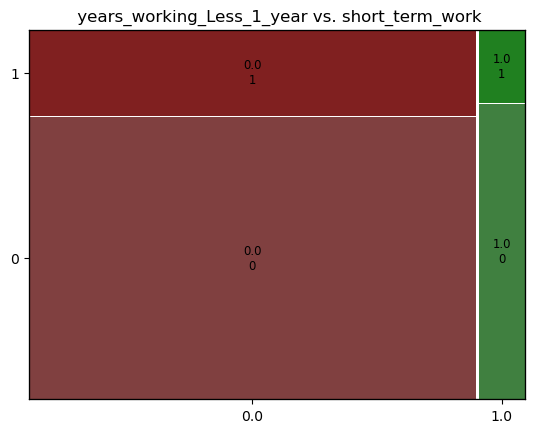

<Figure size 800x400 with 0 Axes>

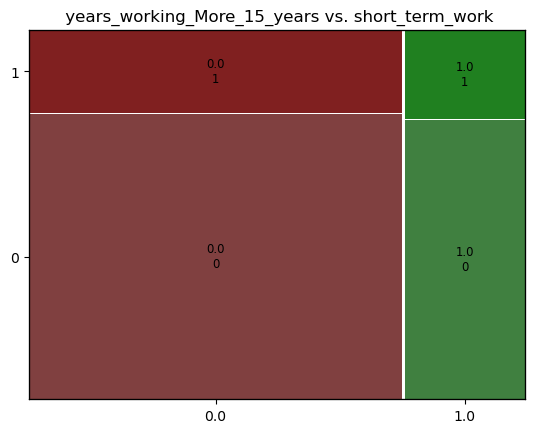

<Figure size 800x400 with 0 Axes>

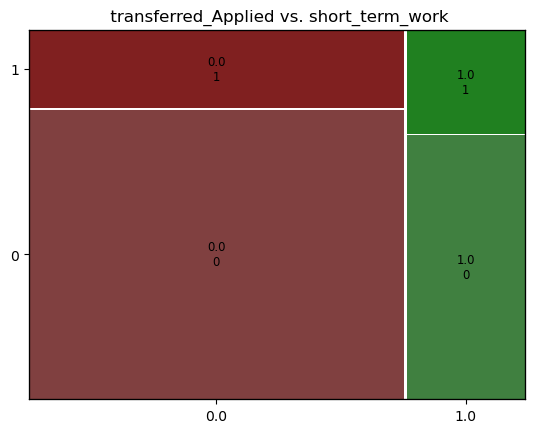

<Figure size 800x400 with 0 Axes>

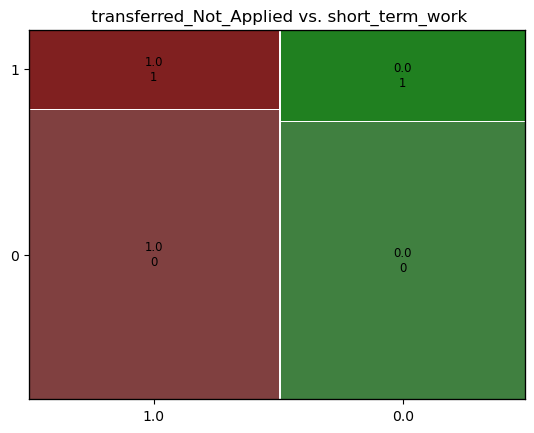

<Figure size 800x400 with 0 Axes>

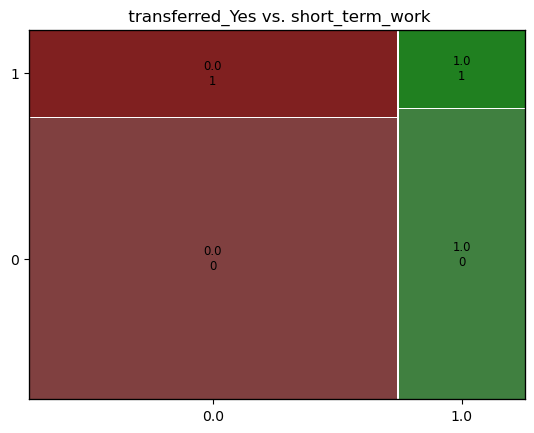

<Figure size 800x400 with 0 Axes>

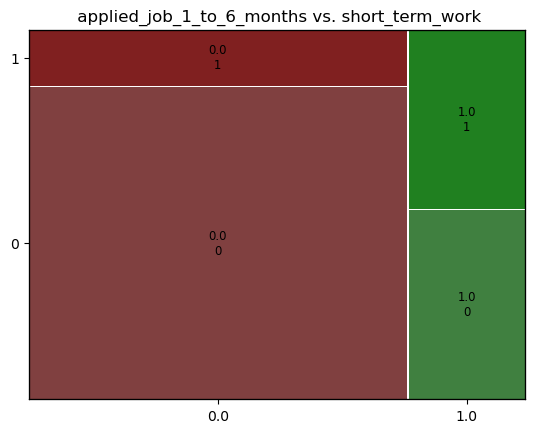

<Figure size 800x400 with 0 Axes>

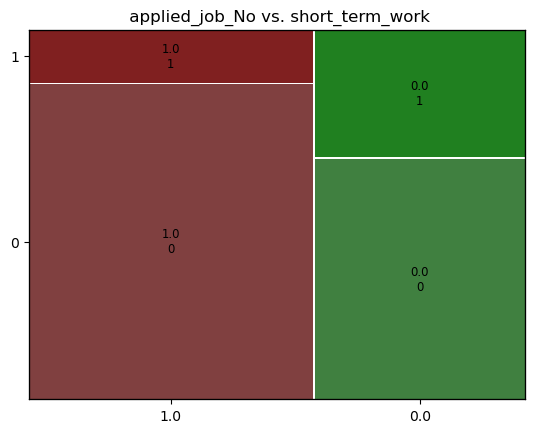

<Figure size 800x400 with 0 Axes>

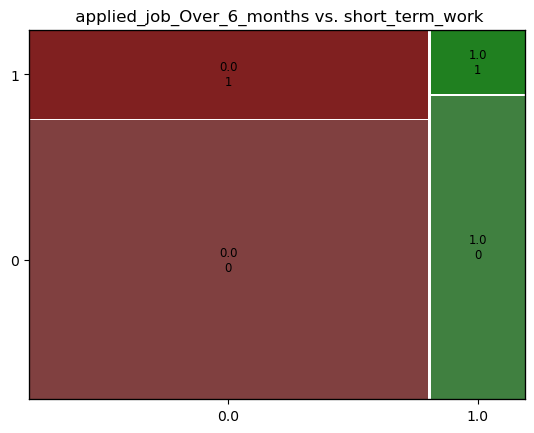

<Figure size 800x400 with 0 Axes>

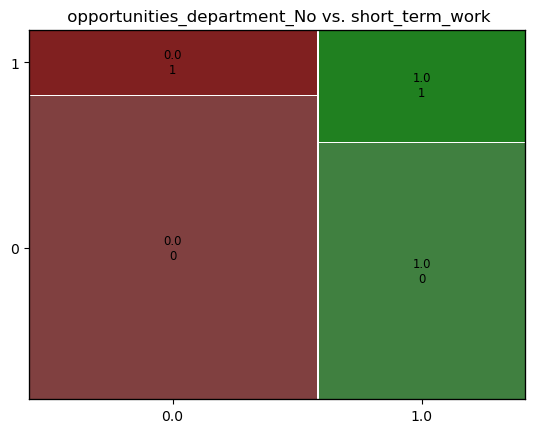

<Figure size 800x400 with 0 Axes>

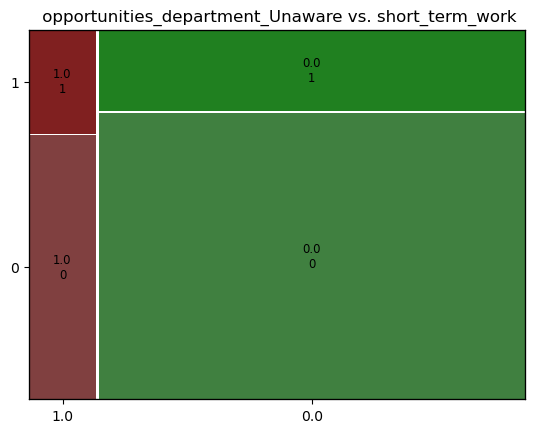

<Figure size 800x400 with 0 Axes>

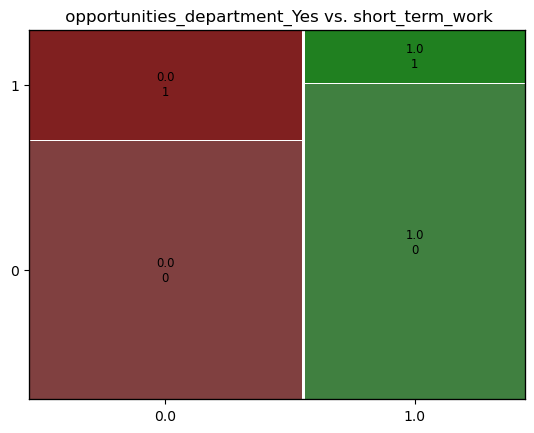

<Figure size 800x400 with 0 Axes>

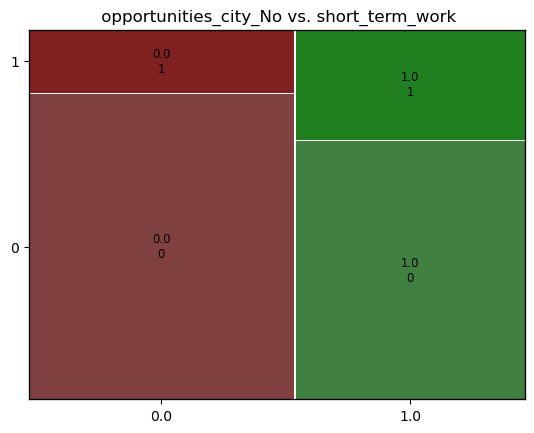

<Figure size 800x400 with 0 Axes>

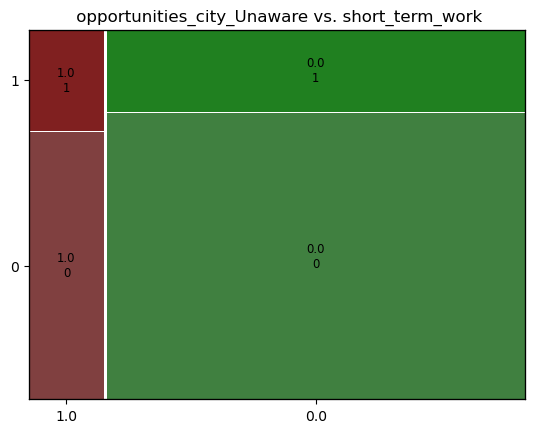

<Figure size 800x400 with 0 Axes>

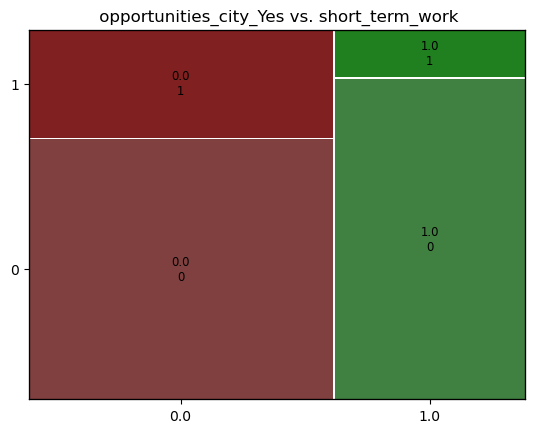

<Figure size 800x400 with 0 Axes>

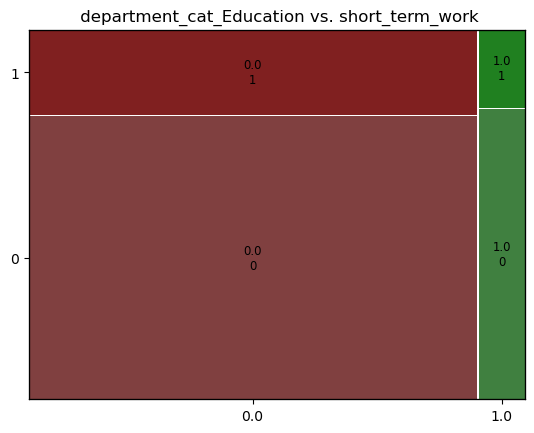

<Figure size 800x400 with 0 Axes>

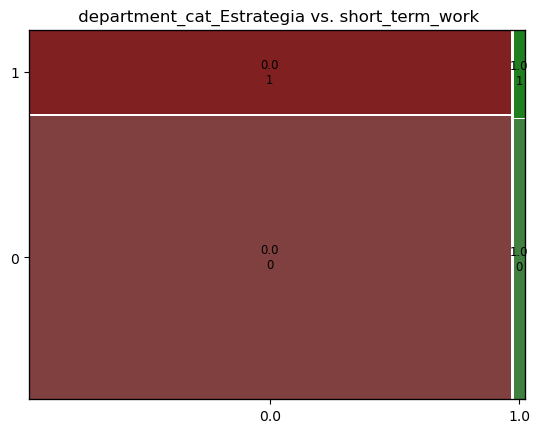

<Figure size 800x400 with 0 Axes>

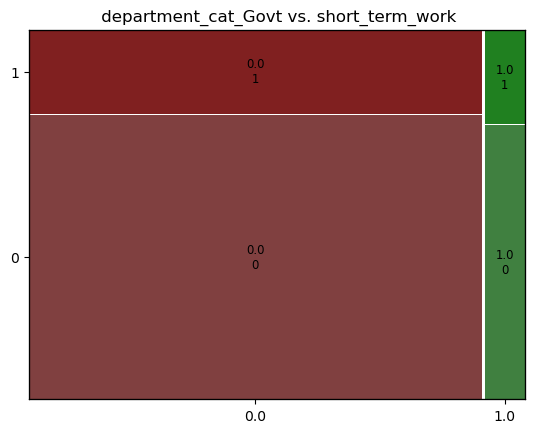

<Figure size 800x400 with 0 Axes>

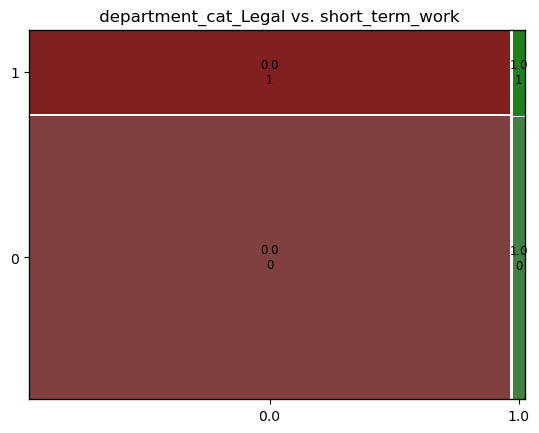

<Figure size 800x400 with 0 Axes>

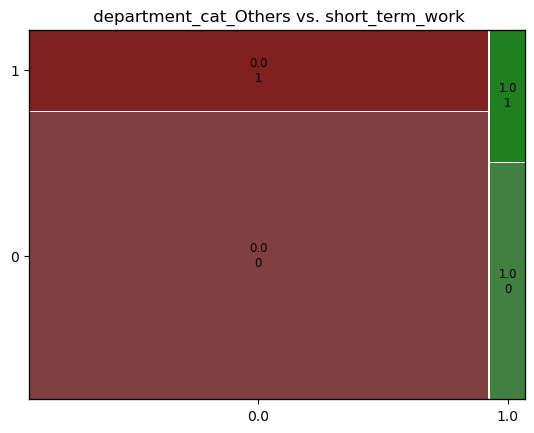

<Figure size 800x400 with 0 Axes>

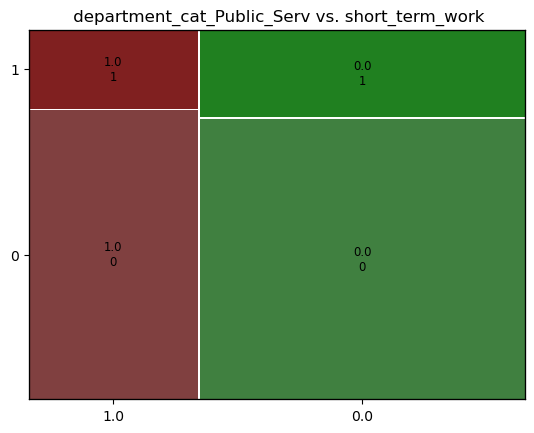

<Figure size 800x400 with 0 Axes>

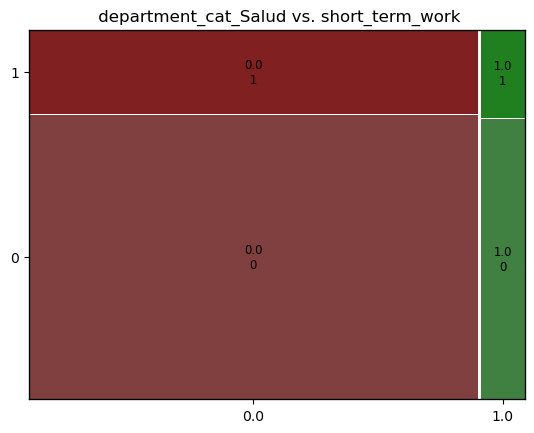

<Figure size 800x400 with 0 Axes>

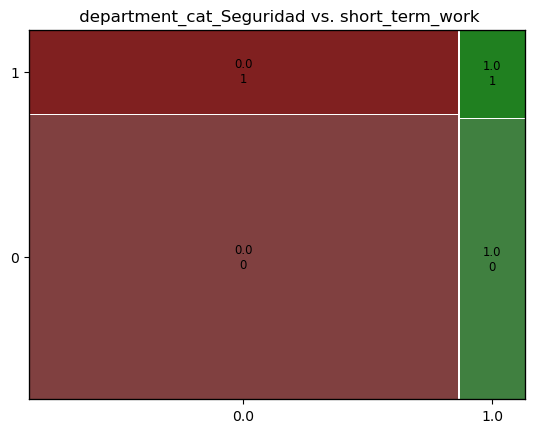

<Figure size 800x400 with 0 Axes>

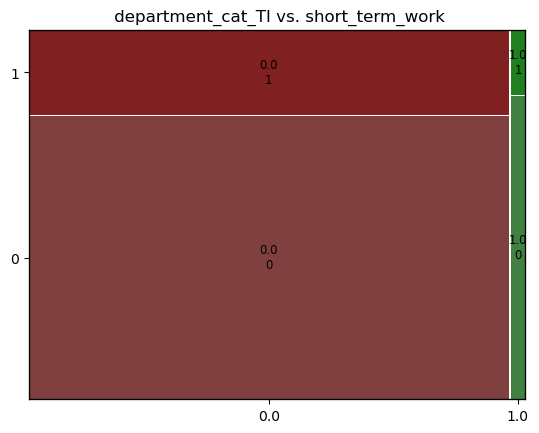

<Figure size 800x400 with 0 Axes>

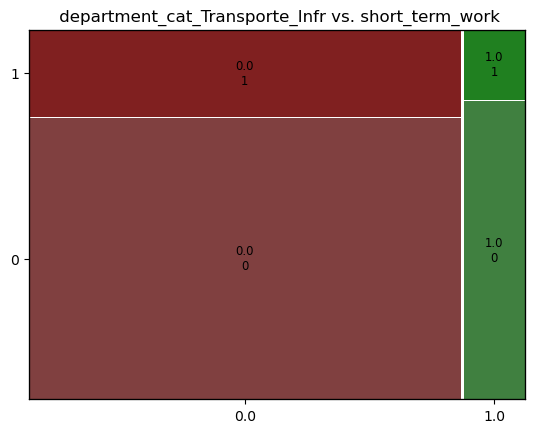

In [148]:
for i in df_tree.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1).columns:
    plt.figure(figsize = (8, 4))  
    plt.clf()
    mosaic(df_tree,[i,'short_term_work'],gap=0.005, title = f' {i} vs. short_term_work')
    plt.show()

C:\Users\usuario\AppData\Local\Temp\ipykernel_12136\676543589.py:6: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



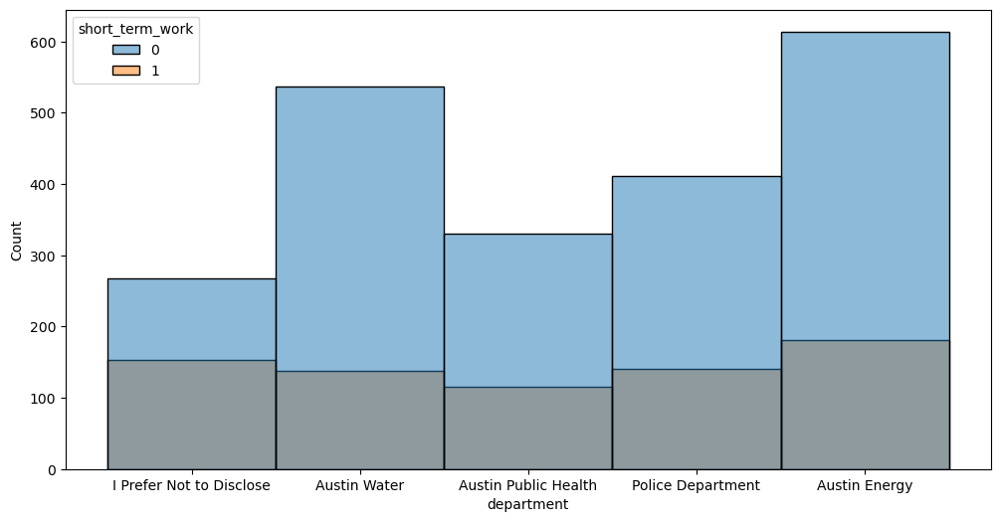

In [149]:
top_5 = df_1['department'].value_counts().nlargest(5).index

plt.figure(figsize=(12, 6))

sns.histplot(data = df_1, x=df_1[df_1['department'].isin(top_5)]['department'],
             hue = df_1[['short_term_work']].applymap(lambda x: 0 if x in ['Extremely Likely', 'Likely'] else 1).squeeze())

plt.show()

Ninguna variable parece ser independientemente sumamente significativa para la variable dependiente. Las más rescatables son: recommend_city, recommend_department, applied_job, work_balance y feel_valued

Dada la relacion de long_term_work y de retire con la variable objetivo, dada la formulación de la pregunta, lo más probable es que las eliminemos del dataset.

#### Modelos 

#### Regresión Logística

Procedemos a realizar el primer modelo, en este caso una Regresión Logística. Se utilizara el dataframe creado para dicho caso

In [155]:
sc = StandardScaler()
# X = sc.fit_transform(df_logistic.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1))
X = df_logistic.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1)
y = df_logistic['short_term_work']

X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X, y, test_size = 0.2, stratify = y , random_state = 1234)
#X_test_r, X_val_r, y_test_r, y_val_r = train_test_split(X_test, y_test, test_size = 0.5, stratify = y_test , random_state = 1234)

pd.reset_option('display.max_rows')

print('Training dataset shape:', X_train_lr.shape, y_train_lr.shape)
print('Testing dataset shape:', X_test_lr.shape, y_test_lr.shape)

Training dataset shape: (5218, 33) (5218,)
Testing dataset shape: (1305, 33) (1305,)


Se eliminaron de las variables independientes, long_term_work y retire, dada la alta correlación y mismo proposito con la variable dependiente. A su vez, se descarto id dado su aletoriedad y poca relación.

In [157]:
# Train
print('----------------------------------')
print('Train')
print('----------------------------------')
print(y_train_lr.value_counts(normalize=True))
print(y_train_lr.value_counts())
print(y_train_lr.value_counts().sum())

# Test
print('----------------------------------')
print('Test')
print('----------------------------------')
print(y_test_lr.value_counts(normalize=True))
print(y_test_lr.value_counts())
print(y_test_lr.value_counts().sum())


----------------------------------
Train
----------------------------------
short_term_work
0    0.769644
1    0.230356
Name: proportion, dtype: float64
short_term_work
0    4016
1    1202
Name: count, dtype: int64
5218
----------------------------------
Test
----------------------------------
short_term_work
0    0.770115
1    0.229885
Name: proportion, dtype: float64
short_term_work
0    1005
1     300
Name: count, dtype: int64
1305


Se dividió el dataset en data de entramiento y de testeo. Se utilizo una distribución 80% y 20%, respectivamente. Se fijó una misma semilla para reproducibilidad del modelo. En este caso no se aplico una transformación escalar a las variables, ya que se encuentran en la misma unidad, por así decirlo.

In [159]:
lr = LogisticRegression(random_state = 1234)

param_grid = {
    'penalty': [ 'l1', 'l2'],
    'C': [0.01, 0.1, 1, 10],
    'solver': ['liblinear', 'saga'],
    'class_weight': [None, 'balanced'],
    'max_iter': [100, 500]
}

model_lr = GridSearchCV(lr, param_grid, scoring = 'recall', cv = 5, n_jobs = -1)

model_lr.fit(X_train_lr, y_train_lr)

GridSearchCV(cv=5, estimator=LogisticRegression(random_state=1234), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 1, 10],
                         'class_weight': [None, 'balanced'],
                         'max_iter': [100, 500], 'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'saga']},
             scoring='recall')

Se utilizó el mecanismo de grid search, para conseguir las mejores condiciones efecientizando la precisión con la que identifica a los empleados próximos a renunciar del empleo en el próximo año.

In [161]:
print("Mejores parámetros LR:", model_lr.best_params_)

Mejores parámetros LR: {'C': 0.01, 'class_weight': 'balanced', 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


Al final se decidió por balancear la variable dependiente dada la desigualdad del 70/30 que tenían. Penalizó los coeficientes de las variables independientes con Riedge.

In [163]:

# Predicciones de probabilidad
##y_proba = modelo.predict_proba(X_test)[:, 1]

# Cambiar el umbral
##threshold = 0.45

# Predecir con datos de prueba
##y_pred = (y_proba > threshold).astype(int)

# Predecir con datos de prueba
y_pred = model_lr.predict(X_test_lr)

# Evaluar el modelo
print("Precisión:", accuracy_score(y_test_lr, y_pred))
print("\nMatriz de confusión:\n", confusion_matrix(y_test_lr, y_pred))
print("\nReporte de clasificación:\n", classification_report(y_test_lr, y_pred))

Precisión: 0.7264367816091954

Matriz de confusión:
 [[725 280]
 [ 77 223]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.90      0.72      0.80      1005
           1       0.44      0.74      0.56       300

    accuracy                           0.73      1305
   macro avg       0.67      0.73      0.68      1305
weighted avg       0.80      0.73      0.75      1305



In [164]:
def saca_metricas(y1, y2):
    print('Matriz de Confusión')
    print(confusion_matrix(y1, y2))
    print('Accuracy:', accuracy_score(y1, y2))
    print('Precision:', precision_score(y1, y2))
    print('Recall:', recall_score(y1, y2))
    print('F1 Score:', f1_score(y1, y2))
    
    # Cálculo de la curva ROC y AUC
    false_positive_rate, recall, _ = roc_curve(y1, y2)
    roc_auc = auc(false_positive_rate, recall)
    print('AUC:', roc_auc)
    
    # Crear gráfico interactivo con Plotly
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=false_positive_rate, y=recall, mode='lines', name='Curva ROC', line=dict(color='blue')))
    fig.add_trace(go.Scatter(x=[0, 1], y=[0, 1], mode='lines', name='Línea base', line=dict(color='red', dash='dash')))
    
    fig.update_layout(
        title=f'Curva ROC (AUC = {roc_auc:.2f})',
        xaxis_title='False Positive Rate',
        yaxis_title='Recall',
        template='plotly_white'
    )
    
    fig.show()

Matriz de Confusión
[[725 280]
 [ 77 223]]
Accuracy: 0.7264367816091954
Precision: 0.4433399602385686
Recall: 0.7433333333333333
F1 Score: 0.5554171855541719
AUC: 0.7323631840796019


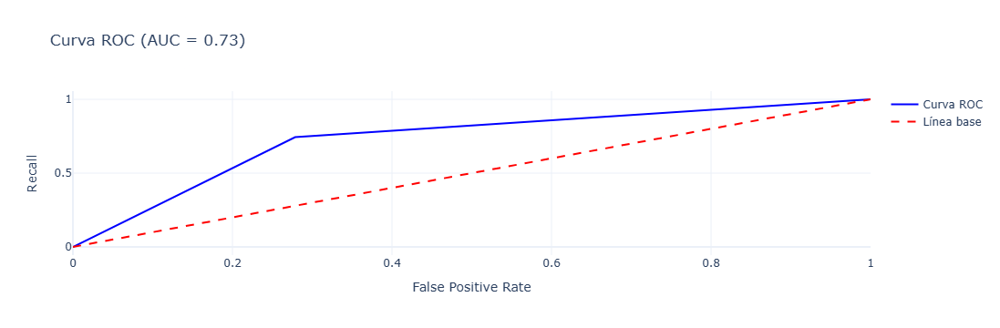

In [165]:
saca_metricas(y_test_lr, y_pred)

El modelo presenta un recall del valor 1 del 74%, el cual es un valor aceptable para términos de Negocios. Un F1 Score por encima del 50%, lo que refiere un buen balance. El modelo no sabe identificar de manera precisa a los más probables de partir dada todas las observaciones del dataset.

##### Validación de sobreajuste

In [168]:
y_pred_train = model_lr.predict(X_train_lr)

# Evaluar el modelo
print("Precisión:", accuracy_score(y_train_lr, y_pred_train))
print("\nMatriz de confusión:\n", confusion_matrix(y_train_lr, y_pred_train))
print("\nReporte de clasificación:\n", classification_report(y_train_lr, y_pred_train))

Precisión: 0.7272901494825603

Matriz de confusión:
 [[2912 1104]
 [ 319  883]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.90      0.73      0.80      4016
           1       0.44      0.73      0.55      1202

    accuracy                           0.73      5218
   macro avg       0.67      0.73      0.68      5218
weighted avg       0.80      0.73      0.75      5218



Matriz de Confusión
[[2912 1104]
 [ 319  883]]
Accuracy: 0.7272901494825603
Precision: 0.4443885254151988
Recall: 0.7346089850249584
F1 Score: 0.5537786139855754
AUC: 0.729854293309292


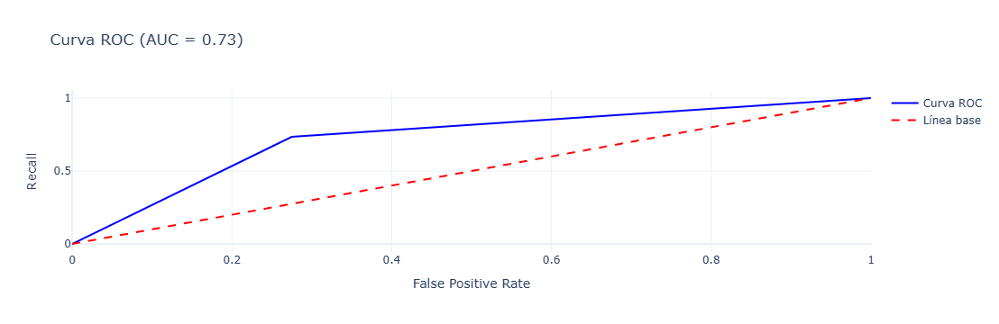

In [169]:
saca_metricas(y_train_lr, y_pred_train)

No existe sobreajuste, la variación es mínima entre las métricas de ambos conjuntos de datos, test y train.

#### Random Forest

Se utilizará el dataset de árboles, en el cual no se dropearon ninguna variable explicativa.

In [173]:
X = df_tree.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1)
y = df_tree['short_term_work']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y , random_state = 1234)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

Training dataset shape: (5218, 39) (5218,)
Testing dataset shape: (1305, 39) (1305,)


In [174]:
rf = RandomForestClassifier(n_estimators=100,          
                            random_state = 1234,
                            class_weight='balanced')

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

# Evaluar el modelo
print("Precisión:", accuracy_score(y_test, y_pred))
print("\nMatriz de confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

Precisión: 0.8114942528735632

Matriz de confusión:
 [[955  50]
 [196 104]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.83      0.95      0.89      1005
           1       0.68      0.35      0.46       300

    accuracy                           0.81      1305
   macro avg       0.75      0.65      0.67      1305
weighted avg       0.79      0.81      0.79      1305



Matriz de Confusión
[[955  50]
 [196 104]]
Accuracy: 0.8114942528735632
Precision: 0.6753246753246753
Recall: 0.3466666666666667
F1 Score: 0.4581497797356828
AUC: 0.6484577114427861


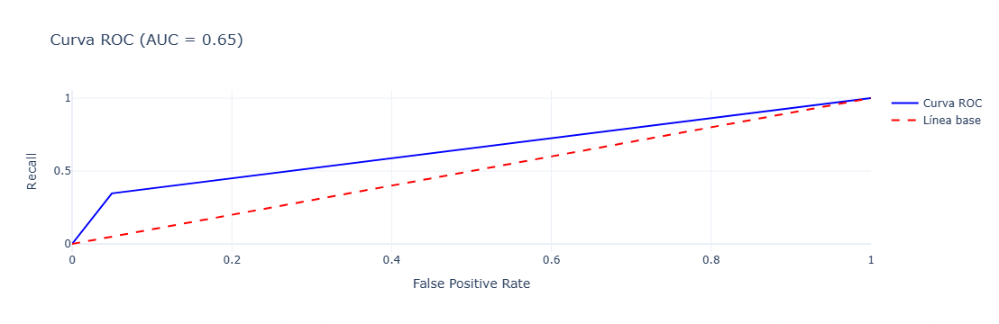

In [175]:
saca_metricas(y_test, y_pred)

Se realizó un modelo base con Random Forest, en lo que lo único que se hizo fue balancear las clases de la variable y. Esta arrojó métricas un tanto decepcionantes. El recall es del 35%. Para este propósito requerimos un mayor valor para dicha métrica.

##### Probando con SMOTE para arreglar el desbalanceo

Para mejorar la estimación del modelo, procederemos a balancear el dataset completo, a través de la técnica SMOTE.

In [179]:
X = df_tree.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1)
y = df_tree['short_term_work']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y , random_state = 1234)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

smote = SMOTE(random_state = 1234)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

Training dataset shape: (5218, 39) (5218,)
Testing dataset shape: (1305, 39) (1305,)


In [180]:
print('----------------------')
print('Data_Original')
print('----------------------')
print(len(X_train))
print(y_train.value_counts())

print('--------------------------------------------------')

print('----------------------')
print('Data_Balanceada_SMOTE')
print('----------------------')
print(len(X_resampled))
print(y_resampled.value_counts())

----------------------
Data_Original
----------------------
5218
short_term_work
0    4016
1    1202
Name: count, dtype: int64
--------------------------------------------------
----------------------
Data_Balanceada_SMOTE
----------------------
8032
short_term_work
0    4016
1    4016
Name: count, dtype: int64


Para seleccionar los mejores hiperparametros 

In [182]:
rf = RandomForestClassifier(random_state = 1234)

param_grid = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'class_weight': [None, 'balanced']
}

model_rf = GridSearchCV(
    rf,
    param_grid,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1,
    verbose = 1)

model_rf.fit(X_resampled, y_resampled)

Fitting 5 folds for each of 120 candidates, totalling 600 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1234),
             n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced'],
                         'max_depth': [5, 10, None], 'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5],
                         'n_estimators': [50, 100, 200, 300, 500]},
             scoring='f1', verbose=1)

In [183]:
print("Mejores parámetros RF:", model_rf.best_params_)

Mejores parámetros RF: {'class_weight': 'balanced', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [184]:
y_pred = model_rf.predict(X_test)

# Evaluar el modelo
print("Precisión:", accuracy_score(y_test, y_pred))
print("\nMatriz de confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

Precisión: 0.8091954022988506

Matriz de confusión:
 [[932  73]
 [176 124]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.84      0.93      0.88      1005
           1       0.63      0.41      0.50       300

    accuracy                           0.81      1305
   macro avg       0.74      0.67      0.69      1305
weighted avg       0.79      0.81      0.79      1305



Matriz de Confusión
[[932  73]
 [176 124]]
Accuracy: 0.8091954022988506
Precision: 0.6294416243654822
Recall: 0.41333333333333333
F1 Score: 0.49899396378269617
AUC: 0.6703482587064676


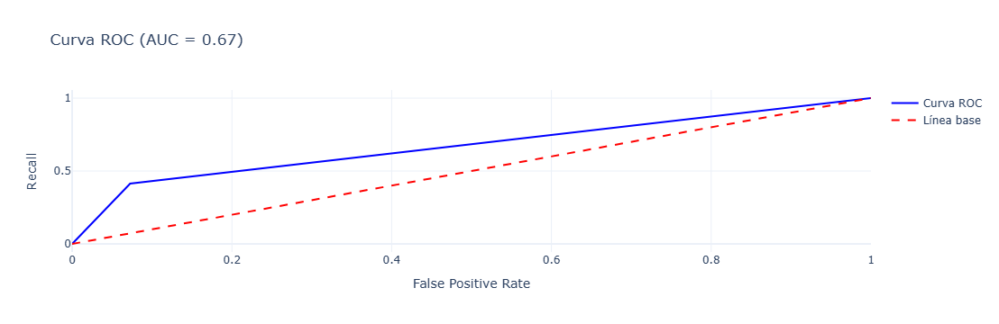

In [185]:
saca_metricas(y_test, y_pred)

Luego de utilizar la técnica de balanceo, y haber aplicado el grid search para obtener los mejores hiperparámetros para el modelo, solo se consiguió una mejoría del 6%, totalizando a 41%, lo que sigue siendo insuficiente.

##### XGBoost

Se utilizó a su vez el dataset de árboles, aplicandole la técnica de SMOTE para balancear. El modelo a utilizar es el XGBoost.

In [189]:
X = df_tree.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1)
y = df_tree['short_term_work']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y , random_state = 1234)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

smote = SMOTE(random_state = 1234)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

Training dataset shape: (5218, 39) (5218,)
Testing dataset shape: (1305, 39) (1305,)


In [190]:
xgb = xgb.XGBClassifier(
    objective = 'binary:logistic',
    use_label_encoder = False,
    eval_metric = 'logloss',
    random_state = 1234
)

param_grid = {
    'n_estimators': [100, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'scale_pos_weight': [1, 2]  
}

model_xgb = GridSearchCV(
    xgb,
    param_grid,
    scoring = 'f1',
    cv = 5,
    n_jobs = -1,
    verbose = 1)

model_xgb.fit(X_resampled, y_resampled)



Fitting 5 folds for each of 96 candidates, totalling 480 fits


C:\Users\usuario\anaconda3\Lib\site-packages\xgboost\training.py:183: UserWarning:

[18:27:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.




GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     feature_weights=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraint...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 1.0],
                         'learning_rate': [0.01, 0.1], 'max_depth': [3, 5, 7],
                         'n_estimators': [100, 300], 'scale_pos_weight': [1, 2],
                         'subsample': [0.8, 1.0]},
             scoring='f1', verbose=1)

In [191]:
print("Mejores parámetros XG:", model_xgb.best_params_)

Mejores parámetros XG: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100, 'scale_pos_weight': 2, 'subsample': 0.8}


In [192]:
y_pred = model_xgb.predict(X_test)

# Evaluar el modelo
print("Precisión:", accuracy_score(y_test, y_pred))
print("\nMatriz de confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

Precisión: 0.7800766283524905

Matriz de confusión:
 [[857 148]
 [139 161]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.86      0.85      0.86      1005
           1       0.52      0.54      0.53       300

    accuracy                           0.78      1305
   macro avg       0.69      0.69      0.69      1305
weighted avg       0.78      0.78      0.78      1305



Matriz de Confusión
[[857 148]
 [139 161]]
Accuracy: 0.7800766283524905
Precision: 0.5210355987055016
Recall: 0.5366666666666666
F1 Score: 0.5287356321839081
AUC: 0.6947014925373134


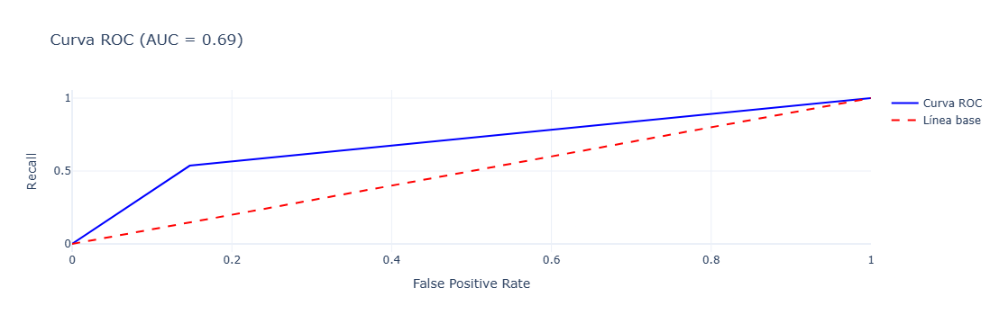

In [193]:
saca_metricas(y_test, y_pred)

Este modelo luego de realizar validación cruzada, produce un Recall del 54%, aún por debajo del modelo de Regresión Logística, pero por encima del Random Forest.

##### Visualización Importancia de Variables

In [196]:
X = df_tree.drop(columns = ['short_term_work','id', 'long_term_work', 'retire'], axis = 1)
y = df_tree['short_term_work']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y , random_state = 1234)

print('Training dataset shape:', X_train.shape, y_train.shape)
print('Testing dataset shape:', X_test.shape, y_test.shape)

smote = SMOTE(random_state = 1234)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

Training dataset shape: (5218, 39) (5218,)
Testing dataset shape: (1305, 39) (1305,)


In [197]:
rf = RandomForestClassifier(class_weight = 'balanced',
                            n_estimators = 500,
                            random_state = 1234)

rf.fit(X_resampled, y_resampled)

y_pred = rf.predict(X_test)

# Evaluar el modelo
print("Precisión:", accuracy_score(y_test, y_pred))
print("\nMatriz de confusión:\n", confusion_matrix(y_test, y_pred))
print("\nReporte de clasificación:\n", classification_report(y_test, y_pred))

Precisión: 0.8114942528735632

Matriz de confusión:
 [[930  75]
 [171 129]]

Reporte de clasificación:
               precision    recall  f1-score   support

           0       0.84      0.93      0.88      1005
           1       0.63      0.43      0.51       300

    accuracy                           0.81      1305
   macro avg       0.74      0.68      0.70      1305
weighted avg       0.80      0.81      0.80      1305



In [198]:
def plot_feature_importance(model, X_train):
    feat_importances = pd.DataFrame(model.feature_importances_, index=X_train.columns, columns=["Importance"])
    feat_importances.sort_values(by='Importance', ascending=False, inplace=True)
    
    fig = px.bar(feat_importances, x=feat_importances.index, y='Importance', title='Feature Importances', labels={'x': 'Features', 'Importance': 'Importance'}, template='plotly_white')
    fig.show()

    return feat_importances

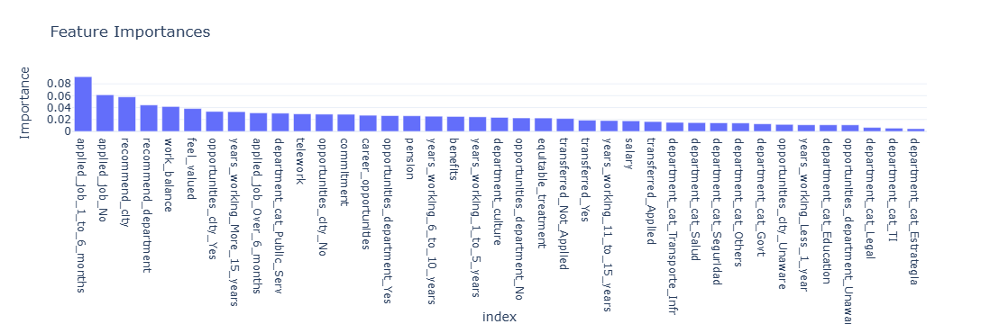

In [199]:
feature_importances = plot_feature_importance(rf, X_resampled)

In [200]:
feature_importances[:30]

,Importance
applied_job_1_to_6_months,0.091993
applied_job_No,0.061509
recommend_city,0.058013
recommend_department,0.044376
work_balance,0.041808
feel_valued,0.038415
opportunities_city_Yes,0.033521
years_working_More_15_years,0.033106
applied_job_Over_6_months,0.031162
department_cat_Public_Serv,0.030602


Se utilizó la herramienta que proporciona el modelo de Random Forest para obtener las variables más importantes y significativas para la definición de la variable dependiente. Se concluyó que las variables con mayor relevancia son: applied_job_1_to_6_month, aplied_job_No, recommend_city, recommend_deparment, work_balance y feel_valued. 

#### Modelo Final

Para la estructuración del modelo final, lo que se buscará es colocar todo el proceso, desde la limpieza de data, pasando por las transformaciones de las variables, hasta llegar a la predicción del término objetivo, todo en un mismo pipeline. Esto sirve para poner en un futuro el modelo en producción para generar estimaciones, y para evitar Data Lekeage. Para la modelización se utilizará la Regresión Logística.

In [204]:
df = pd.read_csv(r'2024_Citywide_Retention_Audit_-_Employee_Survey_Results.csv')

X = df.drop(columns = ['Q4A_I intend to be working for the City 1 year from now.'], axis = 1)
y = df['Q4A_I intend to be working for the City 1 year from now.'].rename('short_term_work')

def short_term_ohe(var):
    if var in ['Extremely Likely','Likely']:
        return 0
    else:
        return 1

y = pd.DataFrame(y)

for i in y:
    y[i] = y[i].apply(lambda x: short_term_ohe(x))

y = y['short_term_work']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1234)

##### Variables a considerar

In [206]:
categorized_departments = {
    "Salud": [
        "Austin Public Health",                             
        "Austin/Travis County Emergency Medical Services",  
        "Office of the Chief Medical Officer",              
        "Chronic Disease Unit",                             
        "EMS",                                              
        "CDU Public health",                                
        "ATCEMS",                                           
        "EMS and this is why i dont feel valued by the city. They dont include us in the department drop down list!!!!!", 
        "EMS, the fact that my department was not listed on this list makes me want to go back and change some of my answers",
        "Chronic Disease unit",
    ],
    "Seguridad": [
        "Fire Department",                                  
        "Police Department",                                
        "Austin Police Department",                         
        "Forensic Science Department",                      
        "Homeland Security and Emergency Management",       
        "Austin Security",                                  
        "Office of Police Oversight",                       
        "Code Department",                                  
        "Code Dept",                                        
        "Austin Animal Center",                             
    ],
    "Public_Serv": [
        "Austin 3-1-1",                                      
        "Austin Water",                                      
        "Austin Resource Recovery",                          
        "Watershed Protection",                              
        "Building Services",                                 
        "Transportation and Public Works",                   
        "Austin Energy",                                     
        "Utility Forestry",                                  
        "Special Services Division - Industrial Waste",      
        "warehouse",                                         
    ],
    "Transporte_Infr": [
        "Austin-Bergstrom International Airport",            
        "Aviation",                                          
        "Fleet Mobility Services",                           
        "Austin Convention Center",                          
        "Convention Center", 
        "Development Services Department",
    ],
    "Govt": [
        "City Manager",                                      
        "City Council",                                      
        "Mayor and Council",                                 
        "Office of Resilience",                              
        "Office of Real Estate Services",                    
        "Telecommunications and Regulatory Affairs",         
        "City Clerk",                                        
        "Intergovernmental Relations",                       
        "Office of Civil Rights",                            
        "Office of Sustainability",                          
        "Equity Office",                                     
        "Innovation Office",                                 
        "City Auditor",                                      
        "Capital Contracting Office",                        
        "Capital Delivery Services",                         
        "Capital Delivery Services Dept.",                   
        "Financial Services Department",                     
        "Purchasing Office",
        "Human Resources",
    ],
    "Legal": [
        "Law Department",                                    
        "Municipal Court",                                   
        "Community Court",                                   
        "Downtown Austin Community Court",                   
    ],
    "TI": [
        "Communications and Technology Management",          
        "Information Security Office",                       
    ],
    "Education": [
        "Austin Public Library",                             
        "Parks and Recreation but Cultural Museums",
        "Parks and Recreation",
    ],
    "Estrategia": [
        "Planning Department",                               
        "Economic Development Department",                   
        "Small and Minority Business Resources",             
        "Housing Department",                                
        "Homeless Strategy Office",                          
        "Innovation Office",                                 
    ],
    "Others": [
        "I Prefer Not to Disclose",                          
        "RATHER NOT SAY DUE TO RETALIATION",                   
        "BSD",                                                                             
        "Communications and Public Information Office",      
    ]
}

department_to_category = {
    dept: category
    for category, depts in categorized_departments.items()
    for dept in depts
}

#----------------------------------------------------------

rename_columns = ['id'
,'years_working'
,'transferred'
,'additional_opport'
,'incentives_new_departm'
,'better_compensation'
,'better_management'
,'thought_prev_departm'
,'more_opport'
,'long_term_work'
,'retire'
,'applied_job'
,'benefits'
,'career_opportunities'
,'commitment'
,'salary'
,'equitable_treatment'
,'department_culture'
,'pension'
,'telework'
,'opportunities_department'
,'opportunities_city'
,'work_balance'
,'feel_valued'
,'recommend_department'
,'recommend_city'
,'department'
,'retention_program']

#----------------------------------------------------------

likely_unlikely = ['long_term_work', 'retire']
importance = ['benefits', 'commitment', 'salary', 'equitable_treatment', 'department_culture','pension', 'telework', 'career_opportunities']
agree = ['work_balance', 'feel_valued', 'recommend_department', 'recommend_city']
department = ['opportunities_department']
city = ['opportunities_city']
transferred = ['transferred']
years_working = ['years_working']
applied_job = ['applied_job']


#----------------------------------------------------------

logistict_drop = ['years_working_1_to_5_years', 'transferred_Not_Applied', 'applied_job_No',
                  'opportunities_department_Yes', 'opportunities_city_No', 'department_cat_Public_Serv', 'id', 'department', 'long_term_work','retire']

#----------------------------------------------------------

nominal = ['years_working','transferred', 'applied_job', 'opportunities_department', 'opportunities_city', 'department_cat']


##### Objetos y clases 

In [208]:
## Limpieza

class DataCleaner(BaseEstimator, TransformerMixin):
    def __init__(self, rename_columns=None, null_threshold=40):
        self.rename_columns = rename_columns
        self.null_threshold = null_threshold
        self.columns_to_drop_ = []
        self.column_names_ = None  # Guardar nombres tras renombrar

    def fit(self, X, y=None):
        X = X.copy()

        if self.rename_columns is not None:
            if len(X.columns) != len(self.rename_columns):
                raise ValueError("La cantidad de nuevos nombres no coincide con el número de columnas del DataFrame.")
            X.columns = self.rename_columns

        missing_percent = X.isnull().mean() * 100
        self.columns_to_drop_ = missing_percent[missing_percent >= self.null_threshold].index.tolist()

        self.column_names_ = X.drop(columns=self.columns_to_drop_, errors='ignore').columns.tolist()

        return self

    def transform(self, X):
        X = X.copy()

        if self.rename_columns is not None:
            if len(X.columns) != len(self.rename_columns):
                raise ValueError("La cantidad de nuevos nombres no coincide con el número de columnas del DataFrame.")
            X.columns = self.rename_columns

        X = X.drop(columns=self.columns_to_drop_, errors='ignore')

        return X

## Importance 

class ImportanceMapper(BaseEstimator, TransformerMixin):
    def __init__(self, columns = None):
        self.columns = columns
        self.importance_order = {
            'Not Important At All': 3,
            'Of Little Importance': 2,
            'Very Important': 1,
            'Absolutely Essential': 0,
        }

    def fit(self, X, y = None):
        return self  

    def transform(self, X):
        X = X.copy()
        
        for col in self.columns:
            X[col] = X[col].apply(lambda x: 'Not Important At All' if x == 'Neither Important Nor Unimportant' else x)
            X[col] = X[col].map(self.importance_order)
        
        return X

## Likely_unlikely 

class Likely_unlikelyMapper(BaseEstimator, TransformerMixin):
    def __init__(self, columns=None):
        self.columns = columns
        self.likely_unlikely_order = {
            'Extremely unlikely': 4,
            'Unlikely': 3,
            'Neutral': 2,
            'Likely': 1,
            'Extremely Likely': 0,
}

    def fit(self, X, y = None):
        return self  

    def transform(self, X):
        X = X.copy()
        
        for col in self.columns:
            X[col] = X[col].map(self.likely_unlikely_order)
        return X

## Agree 

class AgreeMapper(BaseEstimator, TransformerMixin):
    def __init__(self, columns = None):
        self.columns = columns
        self.agree_order = {
        'Strongly Disagree': 4,
        'Disagree': 3,
        'Neutral': 2,
        'Agree': 1,
        'Strongly Agree': 0,
}

    def fit(self, X, y = None):
        return self  

    def transform(self, X):
        X = X.copy()
        
        for col in self.columns:
            X[col] = X[col].map(self.agree_order)
        
        return X

## Recomm Department

class DepartmentLabel(BaseEstimator, TransformerMixin):
    def __init__(self, columns = None):
        self.columns = columns if columns is not None else []

    def fit(self, X, y = None):
        return self

    def transform(self, X):
        X = X.copy()
        for col in self.columns:
            X[col] = X[col].apply(lambda x: 'Unaware' if x == 'I am unaware of any training or development opportunities offered by my department.' else x)
        return X

## Recomm City

class CityLabel(BaseEstimator, TransformerMixin):
    def __init__(self, columns = None):
        self.columns = columns if columns is not None else []

    def fit(self, X, y = None):
        return self

    def transform(self, X):
        X = X.copy()
        for col in self.columns:
            X[col] = X[col].apply(lambda x: 'Unaware' if x == 'I am unaware of any training or development opportunities offered the City.' else x)
        return X

## Transferred

class TransferredLabel(BaseEstimator, TransformerMixin):
    def __init__(self, column = None):
        self.column = column

    def fit(self, X, y = None):
        return self

    def transform(self, X):
        X = X.copy()
        
        def transferred_label(var):
            if var == ('No, I have not transferred between City departments. '
                       'I also have not applied to a job in another department while at my current department.'):
                return 'Not_Applied'
            elif var == ('No, I have not transferred between City departments. '
                         'However, I have applied to a job in another department while at my current department.'):
                return 'Applied'
            else:
                return 'Yes'
        
        X[self.column] = X[self.column].apply(transferred_label)
        return X

## Applied Job

class AppliedJobLabel(BaseEstimator, TransformerMixin):
    def __init__(self, column = None):
        self.column = column

    def fit(self, X, y = None):
        return self

    def transform(self, X):
        X = X.copy()
        
        def applied_job_label(var):
            if var == ('I have not applied for any jobs outside the City'):
                return 'No'
            elif var in ['Within the past 3 months', '3 months to 6 months ago']:
                return '1_to_6_months'
            else:
                return 'Over_6_months'
        
        X[self.column] = X[self.column].apply(applied_job_label)
        return X

## Years Working

class YearsWorkingLabel(BaseEstimator, TransformerMixin):
    def __init__(self, column = None):
        self.column = column

    def fit(self, X, y = None):
        return self

    def transform(self, X):
        X = X.copy()
        
        def years_working_label(var):
            if var == ('Less than a year'):
                return 'Less_1_year'
            elif var == ('Between 1 and 5 years'):
                return '1_to_5_years'
            elif var == ('6 to 10 years'):
                return '6_to_10_years'
            elif var == ('11 to 15 years'):
                return '11_to_15_years'     
            else:
                return 'More_15_years'
        
        X[self.column] = X[self.column].apply(years_working_label)
        return X

## OHE 

class OHEDataFrameWrapper(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.ohe = OneHotEncoder(handle_unknown = 'ignore', sparse_output = False)
        self.feature_names = None

    def fit(self, X, y=None):
        self.ohe.fit(X[self.columns])
        self.feature_names = self.ohe.get_feature_names_out(self.columns)
        return self

    def transform(self, X):
        ohe_array = self.ohe.transform(X[self.columns])
        ohe_df = pd.DataFrame(ohe_array, columns=self.feature_names, index=X.index)
        X_ = X.drop(columns=self.columns)
        return pd.concat([X_, ohe_df], axis=1)

## Department 

class DepartmentCategorizer(BaseEstimator, TransformerMixin):
    def __init__(self, mapping_dict, source_column = 'department', new_column = 'department_cat'):
        self.mapping_dict = mapping_dict
        self.source_column = source_column
        self.new_column = new_column

    def fit(self, X, y = None):
        return self

    def transform(self, X):
        X = X.copy()
        X[self.new_column] = X[self.source_column].map(self.mapping_dict)
        return X

## Drop OHE Variables

class ColumnDropper(BaseEstimator, TransformerMixin):
    def __init__(self, columns_to_drop):
        self.columns_to_drop = columns_to_drop

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = pd.DataFrame(X)  
        X.drop(columns = [col for col in self.columns_to_drop if col in X.columns], axis = 1, inplace = True)
        return X   


lr = LogisticRegression(C = 0.01,
                        class_weight = 'balanced',
                        max_iter = 100,
                        penalty = 'l1',
                        solver = 'saga',
                        random_state = 1234)

##### Pipeline 

In [210]:

# Pipeline final
pipeline = Pipeline([
    ('cleaner', DataCleaner(rename_columns = rename_columns, null_threshold = 40)),
    ('importance_mapper', ImportanceMapper(columns = ['benefits', 'commitment', 'salary', 'equitable_treatment', 'department_culture','pension', 'telework', 'career_opportunities'])),
    ('likely_unlikely_mapper', Likely_unlikelyMapper(columns = ['long_term_work', 'retire'])),
    ('agree_mapper', AgreeMapper(columns = ['work_balance', 'feel_valued', 'recommend_department', 'recommend_city'])),
    ('department_label', DepartmentLabel(columns = ['opportunities_department'])),
    ('city_label', CityLabel(columns = ['opportunities_city'])),
    ('transferred_label', TransferredLabel(column = 'transferred')),
    ('years_working_label', YearsWorkingLabel(column = 'years_working')),
    ('applied_job_label', AppliedJobLabel(column = 'applied_job')),
#    ('short_term_encoder', ShortTermWorkBinaryEncoder(column = short_term_work)),
    ('department_categorizer', DepartmentCategorizer(mapping_dict = department_to_category)),
    ('ohe', OHEDataFrameWrapper(columns = nominal)),
    ('column_dropper', ColumnDropper(columns_to_drop = logistict_drop)),
    ('classifier', LogisticRegression(random_state = 1234))
])

param_grid = {
    'classifier__penalty': [ 'l1', 'l2'],
    'classifier__C': [0.01, 0.1, 1, 10],
    'classifier__solver': ['liblinear', 'saga'],
    'classifier__class_weight': [None, 'balanced'],
    'classifier__max_iter': [100, 500]
}

grid_search = GridSearchCV(
    estimator = pipeline,
    param_grid = param_grid,
    cv = 5,                     
    scoring = 'recall',       
    n_jobs = -1,                
)

grid_search.fit(X_train, y_train)

y_pred = grid_search.predict(X_test)


##### Validación del funcionamiento del pipeline

In [212]:
cleaner = DataCleaner(rename_columns=rename_columns, null_threshold=40)
X_clean = cleaner.fit_transform(X)

importance = ImportanceMapper(columns = ['benefits', 'commitment', 'salary', 'equitable_treatment', 'department_culture','pension', 'telework', 'career_opportunities'])
X_importance = importance.fit_transform(X_clean)

likely_mapper = pipeline.named_steps['likely_unlikely_mapper']
X_likely = likely_mapper.fit_transform(X_importance)

agree_mapper = pipeline.named_steps['agree_mapper']
X_agree = agree_mapper.fit_transform(X_likely)

department_label = pipeline.named_steps['department_label']
X_department = department_label.fit_transform(X_agree)

city_label = pipeline.named_steps['city_label']
X_city = city_label.fit_transform(X_department)

transferred_label = pipeline.named_steps['transferred_label']
X_transferred = transferred_label.fit_transform(X_city)

years_working_label = pipeline.named_steps['years_working_label']
X_years_working = years_working_label.fit_transform(X_transferred)

applied_job_label = pipeline.named_steps['applied_job_label']
X_applied = applied_job_label.fit_transform(X_years_working)

department_categorizer = pipeline.named_steps['department_categorizer']
X_depart = department_categorizer.fit_transform(X_applied)

ohe = pipeline.named_steps['ohe']
X_ohe = ohe.fit_transform(X_depart)


column_dropper = pipeline.named_steps['column_dropper']
X_dropper = column_dropper.fit_transform(X_ohe)



Matriz de Confusión
[[701 281]
 [ 90 233]]
Accuracy: 0.7157088122605364
Precision: 0.45330739299610895
Recall: 0.7213622291021672
F1 Score: 0.5567502986857825
AUC: 0.7176057581356048


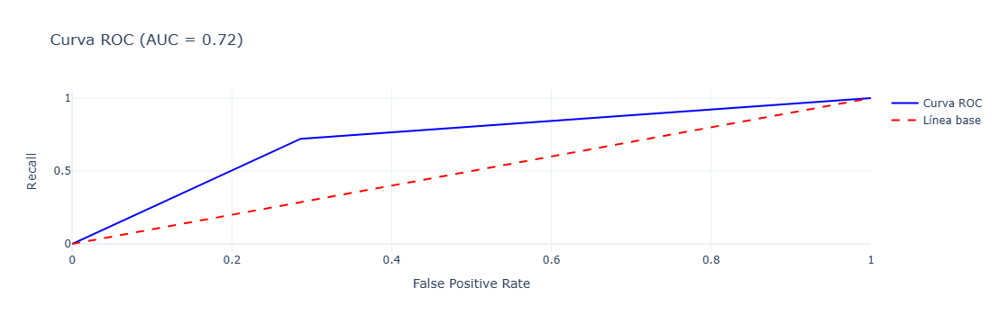

In [213]:
saca_metricas(y_test, y_pred)

In [214]:
grid_search.best_params_

{'classifier__C': 0.01,
 'classifier__class_weight': 'balanced',
 'classifier__max_iter': 100,
 'classifier__penalty': 'l1',
 'classifier__solver': 'liblinear'}

Se obtiene un Recall del 72%, lo que significa que el modelo determina de los empleados que se irían el próximo año del trabajo 72 de cada 100 empleados en esta clasificación. Esto es un resultado aceptable, dado la naturaleza del problema y la recogida de los datos, la cual puede ser un poco incierta, y la dificultad de identificar aquellos empleados que se deciden irse. 

#### Interpretación del Modelo Final

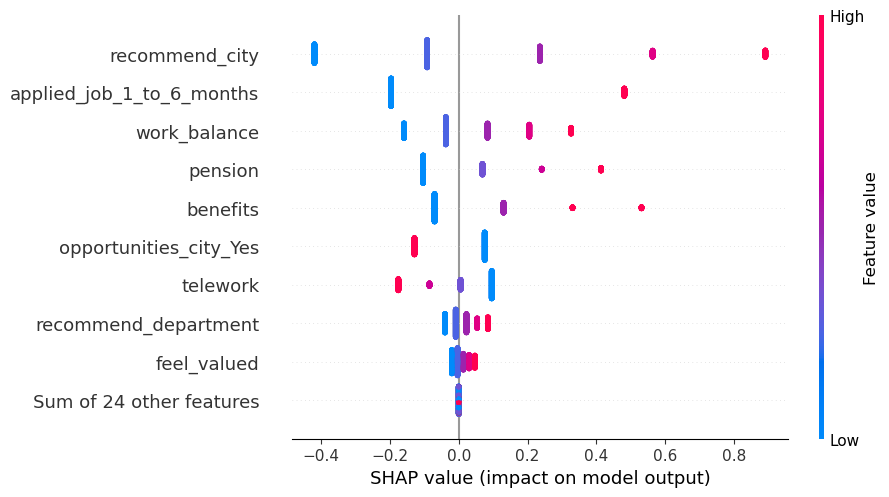

In [217]:
mejor_modelo = model_lr.best_estimator_

explainer = shap.LinearExplainer(mejor_modelo, X_train_lr)

valores = explainer(X_test_lr)

shap.plots.beeswarm(valores, max_display=10)

In [218]:
shap_importance = pd.DataFrame({
    'variable': X_train_lr.columns,
    'mean_abs_shap': valores.abs.mean(0).values  
})

# Ordenar por importancia
shap_importance = shap_importance.sort_values(by='mean_abs_shap', ascending=False)

print(shap_importance.head())

                     variable  mean_abs_shap
11             recommend_city       0.317593
18  applied_job_1_to_6_months       0.257960
8                work_balance       0.121126
6                     pension       0.120151
0                    benefits       0.109377


La mayoría de las variables presentan una alta dispersión, lo cual es esperable dado el carácter categórico de los datos.

Entre las principales razones por las que los empleados deciden dejar su trabajo se encuentran las siguientes:

- No recomendar trabajar en la ciudad.
- Haber aplicado a otro empleo en los últimos seis meses.
- Estar insatisfechos con:
     - El balance entre trabajo y vida personal,
     - Los beneficios laborales,
     - Lo que la empresa les ofrece en general,
     - El plan de pensiones.
- No sentirse valorados dentro de su departamento.
- No recomendar su lugar de trabajo.

La razón más determinante para abandonar el empleo es no recomendar la ciudad de Austin como un buen lugar para trabajar.

En contraste, tener oportunidades de crecimiento profesional dentro de la ciudad es un factor claramente asociado a la permanencia en el empleo.

Por otro lado, los empleados muestran cierta indiferencia frente a beneficios como el teletrabajo o las horas flexibles.

#### Productivizar

In [354]:
pipeline = Pipeline([
    ('cleaner', DataCleaner(rename_columns = rename_columns, null_threshold = 40)),
    ('importance_mapper', ImportanceMapper(columns = ['benefits', 'commitment', 'salary', 'equitable_treatment', 'department_culture','pension', 'telework', 'career_opportunities'])),
    ('likely_unlikely_mapper', Likely_unlikelyMapper(columns = ['long_term_work', 'retire'])),
    ('agree_mapper', AgreeMapper(columns = ['work_balance', 'feel_valued', 'recommend_department', 'recommend_city'])),
    ('department_label', DepartmentLabel(columns = ['opportunities_department'])),
    ('city_label', CityLabel(columns = ['opportunities_city'])),
    ('transferred_label', TransferredLabel(column = 'transferred')),
    ('years_working_label', YearsWorkingLabel(column = 'years_working')),
    ('applied_job_label', AppliedJobLabel(column = 'applied_job')),
#    ('short_term_encoder', ShortTermWorkBinaryEncoder(column = short_term_work)),
    ('department_categorizer', DepartmentCategorizer(mapping_dict = department_to_category)),
    ('ohe', OHEDataFrameWrapper(columns = nominal)),
    ('column_dropper', ColumnDropper(columns_to_drop = logistict_drop)),
    ('classifier', LogisticRegression(random_state = 1234, C = 0.01, class_weight = 'balanced', max_iter = 100, penalty = 'l1', solver = 'liblinear'))
])

with open("modelo_TFM.pkl", "wb") as f:
    pickle.dump(pipeline, f)


# para abrirlo 
# with open("modelo_pipeline.pkl", "rb") as f:
#    loaded_pipeline = pickle.load(f)